# Project PFA Housing Project(Price Predicition)

Problem Statement:                                            
Houses are one of the necessary need of each and every person around the globe and therefore housing and real estate 
market is one of the markets which is one of the major contributors in the world’s economy. It is a very large market 
and there are various companies working in the domain. Data science comes as a very important tool to solve problems 
in the domain to help the companies increase their overall revenue, profits, improving their marketing strategies and 
focusing on changing trends in house sales and purchases. Predictive modelling, Market mix modelling, 
recommendation systems are some of the machine learning techniques used for achieving the business goals for housing 
companies. Our problem is related to one such housing company.
A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses 
data analytics to purchase houses at a price below their actual values and flip them at a higher price. For the same 
purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file 
below.
The company is looking at prospective properties to buy houses to enter the market. You are required to build a model 
using Machine Learning in order to predict the actual value of the prospective properties and decide whether to invest 
in them or not. For this company wants to know:
• Which variables are important to predict the price of variable?
• How do these variables describe the price of the house?     

Business Goal:                                                 
You are required to model the price of houses with the available independent variables. This model will then be used 
by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the 
strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for the 
management to understand the pricing dynamics of a new market

In [1]:
# importing all required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt

import warnings
warnings.filterwarnings('ignore')

In [2]:
# importing csv file train dataset provided for training and prediction
df=pd.read_csv("train.csv")
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,289,20,RL,NaN,9819,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,122000
1164,554,20,RL,67.0,8777,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,5,2009,WD,Normal,108000
1165,196,160,RL,24.0,2280,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2009,WD,Normal,148500
1166,31,70,C (all),50.0,8500,Pave,Pave,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,7,2008,WD,Normal,40000


* We are also provided test dataset, i wont be combining both the dataset as it can lead to data leakage problem which can affect my model accuracy. so i will give both datasets different variable and process the data separately.

In [3]:
# importing test dataset into the jupyter notebook
data=pd.read_csv('test.csv')
data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,...,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,...,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,83,20,RL,78.0,10206,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,10,2008,WD,Normal
288,1048,20,RL,57.0,9245,Pave,NaN,IR2,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal
289,17,20,RL,NaN,11241,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Shed,700,3,2010,WD,Normal
290,523,50,RM,50.0,5000,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,10,2006,WD,Normal


* Here we can see that there are few columns with NaN and 0 values we have to analyse and check whether we need to assign values or need to drop them. we will analyze it in our EDA.

In [4]:
# Lets check the top 10 rows in train dataset
df.head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000
5,1197,60,RL,58.0,14054,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,11,2006,New,Partial,219210
6,561,20,RL,NaN,11341,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2010,WD,Normal,121500
7,1041,20,RL,88.0,13125,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,NaN,0,1,2006,WD,Normal,155000
8,503,20,RL,70.0,9170,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,400,4,2007,WD,Normal,140000
9,576,50,RL,80.0,8480,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2008,COD,Abnorml,118500


In [5]:
# lets check the last 10 rows of test dataset
df.tail(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1158,673,20,RL,NaN,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2006,WD,Normal,165000
1159,943,90,RL,42.0,7711,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,Oth,Abnorml,150000
1160,551,120,RL,53.0,4043,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2008,COD,Abnorml,140000
1161,1301,60,RL,NaN,10762,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2009,WD,Normal,225000
1162,1381,30,RL,45.0,8212,Pave,Grvl,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2010,WD,Normal,58500
1163,289,20,RL,NaN,9819,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,122000
1164,554,20,RL,67.0,8777,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,5,2009,WD,Normal,108000
1165,196,160,RL,24.0,2280,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2009,WD,Normal,148500
1166,31,70,C (all),50.0,8500,Pave,Pave,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,7,2008,WD,Normal,40000
1167,617,60,RL,NaN,7861,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2006,WD,Normal,183200


In [6]:
# lets check the first 10 rows of the train dataset
data.head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,...,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,...,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal
5,650,180,RM,21.0,1936,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,12,2007,WD,Normal
6,1453,180,RM,35.0,3675,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,5,2006,WD,Normal
7,152,20,RL,107.0,13891,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,1,2008,New,Partial
8,427,80,RL,NaN,12800,Pave,NaN,Reg,Low,AllPub,...,396,0,NaN,NaN,NaN,0,8,2009,WD,Normal
9,776,120,RM,32.0,4500,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal


In [7]:
# lets check the last 10 rows of the test dataset
data.tail(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
282,340,20,RL,66.0,12400,Pave,NaN,IR1,Lvl,AllPub,...,234,0,NaN,NaN,NaN,0,6,2009,WD,Normal
283,1116,20,RL,93.0,12085,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,11,2007,New,Partial
284,358,120,RM,44.0,4224,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,8,2007,WD,Normal
285,72,20,RL,69.0,7599,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal
286,56,20,RL,100.0,10175,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,7,2008,WD,Normal
287,83,20,RL,78.0,10206,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,10,2008,WD,Normal
288,1048,20,RL,57.0,9245,Pave,NaN,IR2,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal
289,17,20,RL,NaN,11241,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Shed,700,3,2010,WD,Normal
290,523,50,RM,50.0,5000,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,10,2006,WD,Normal
291,1379,160,RM,21.0,1953,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2006,WD,Normal


* we will analyze and do data processing and cleaning simultaneously of both train and test dataset.

# Exploratory Data Analysis(EDA):

In [8]:
# lets check the shape of train dataset
df.shape

(1168, 81)

* Here we can see that there are 1168 rows present in 81 columns of the train dataset.

In [9]:
# lets check the shape of test dataset
data.shape

(292, 80)

* Here we can see that there are 292 rows present in 80 columns of the test dataset. Our Target column SalePrice which is present in the train dataset, is not present in test dataset.

In [10]:
# lets check the name of all the columns present in the train dataset
df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

* Here we can see names of all the 81 columns present in the train dataset.

In [11]:
# lets check the data type of train dataset
df.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
                  ...   
MoSold             int64
YrSold             int64
SaleType          object
SaleCondition     object
SalePrice          int64
Length: 81, dtype: object

In [12]:
# to view all the rows and column in the dataset
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)

In [13]:
df.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


* Here in train dataset we have 3 types of data types present object=43 columns, float=3 columns and integer=35 columns

In [14]:
# lets check the information regarding presence of null values in the train dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    954 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          77 non-null     object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallC

* Here we can see that there are 4 columns which are having aprox. 80 to 90 % null values, we dont require columns with large no. of null values present as it will affect our models performance. the name of the columns are Alley, PoolQC, Fence, MiscFeature.

In [15]:
# lets remove the columns with large no. of null values
df=df.drop(['Alley','PoolQC','Fence','MiscFeature'],axis=1)

In [16]:
# lets check the shape of train dataset once again
df.shape

(1168, 77)

* Here we can see that we have successfully dropped the four columns with huge no. of Null values.

In [17]:
# lets check the name of columns present in the test dataset
data.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

* Here we can see the name of all the columns which are present in the test dataset.

In [18]:
# lets check the datatype of all the columns in the test dataset
data.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


* Here in train dataset we have 3 types of data types present object=42 columns, float=4 columns and integer=34 columns

In [19]:
# lets check the information regarding presence of null values in the test dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292 entries, 0 to 291
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             292 non-null    int64  
 1   MSSubClass     292 non-null    int64  
 2   MSZoning       292 non-null    object 
 3   LotFrontage    247 non-null    float64
 4   LotArea        292 non-null    int64  
 5   Street         292 non-null    object 
 6   Alley          14 non-null     object 
 7   LotShape       292 non-null    object 
 8   LandContour    292 non-null    object 
 9   Utilities      292 non-null    object 
 10  LotConfig      292 non-null    object 
 11  LandSlope      292 non-null    object 
 12  Neighborhood   292 non-null    object 
 13  Condition1     292 non-null    object 
 14  Condition2     292 non-null    object 
 15  BldgType       292 non-null    object 
 16  HouseStyle     292 non-null    object 
 17  OverallQual    292 non-null    int64  
 18  OverallCon

* Here also we can see that more than 80 to 90 % null values present in same 4 columns as in train dataset.so, we will remove these 4 columns from test dataset as well.

In [20]:
# lets remove the columns with huge no. of Null values
data=data.drop(['Alley','PoolQC','Fence','MiscFeature'],axis=1)

In [21]:
# lets check the shape of test dataset again
data.shape

(292, 76)

* Here we can see that we have successfully dropped all the 4 columns with huge no. of null values present in them.

In [22]:
# lets check the no. of unique values present in each column of the train dataset.
df.nunique()

Id               1168
MSSubClass         15
MSZoning            5
LotFrontage       106
LotArea           892
Street              2
LotShape            4
LandContour         4
Utilities           1
LotConfig           5
LandSlope           3
Neighborhood       25
Condition1          9
Condition2          8
BldgType            5
HouseStyle          8
OverallQual        10
OverallCond         9
YearBuilt         110
YearRemodAdd       61
RoofStyle           6
RoofMatl            8
Exterior1st        14
Exterior2nd        15
MasVnrType          4
MasVnrArea        283
ExterQual           4
ExterCond           5
Foundation          6
BsmtQual            4
BsmtCond            4
BsmtExposure        4
BsmtFinType1        6
BsmtFinSF1        551
BsmtFinType2        6
BsmtFinSF2        122
BsmtUnfSF         681
TotalBsmtSF       636
Heating             6
HeatingQC           5
CentralAir          2
Electrical          5
1stFlrSF          669
2ndFlrSF          351
LowQualFinSF       21
GrLivArea 

* Here we can see that there are 2 columns ID and Utilities, in ID all values are unique as there can't be 1 ID for 2 or 4 properties, and Utilities is having only one unique value present in all the columns, so, both of these columns will not help us in model building so, we will drop these 2 columns as well.

In [23]:
# lets drop the column with all unique value and only 1 unique value
df=df.drop(['Id','Utilities'],axis=1)

In [24]:
# lets check the value counts of each column to see if there are any unrequired data in all the remaining columns of the train dataset before we can proceed
for i in df.columns:
    print(df[i].value_counts())
    print('==================================================')

20     428
60     244
50     113
120     69
70      53
30      52
160     47
80      43
90      41
190     26
85      19
75      14
45      10
180      6
40       3
Name: MSSubClass, dtype: int64
RL         928
RM         163
FV          52
RH          16
C (all)      9
Name: MSZoning, dtype: int64
60.0     111
80.0      60
70.0      58
75.0      46
50.0      44
65.0      35
85.0      26
90.0      20
78.0      19
73.0      16
24.0      16
68.0      16
79.0      14
21.0      14
64.0      14
51.0      13
72.0      13
55.0      13
100.0     12
59.0      12
82.0      12
63.0      11
71.0      11
74.0      11
53.0      10
69.0      10
66.0      10
88.0      10
84.0       9
34.0       9
67.0       9
77.0       8
40.0       8
52.0       8
43.0       8
76.0       8
92.0       8
57.0       7
86.0       7
35.0       7
95.0       7
62.0       7
61.0       7
94.0       6
54.0       6
44.0       6
96.0       6
81.0       6
120.0      6
98.0       6
41.0       6
107.0      5
87.0       5
30.0       

* Here i could not find any column with unrequired or unnecessary data.
* There are few columns with more than 80% of 0 values
BsmtFinSF2, LowQualFinSF,BsmtHalfBath,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal.
these columns will not help our model building in anyway so, we need to drop them.
* Here we can also see few columns with close to 60 % 0 values, we will use Imputation method to assign values to them, we can't drop all the columns columns with null values as removing them can affect our model and our model might not predict accurately.

In [25]:
# lets drop the columns with high percentage of 0 values in the train dataset
df=df.drop(['BsmtFinSF2','LowQualFinSF','BsmtHalfBath','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','MiscVal'],axis=1)

In [26]:
# lets check the shape of train dataset now
df.shape

(1168, 67)

In [27]:
# now Lets check the presence of null values in train dataset to assign them values as per there datatype
df.isnull().sum()

MSSubClass         0
MSZoning           0
LotFrontage      214
LotArea            0
Street             0
LotShape           0
LandContour        0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         7
MasVnrArea         7
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual          30
BsmtCond          30
BsmtExposure      31
BsmtFinType1      30
BsmtFinSF1         0
BsmtFinType2      31
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         0
1stFlrSF           0
2ndFlrSF           0
GrLivArea          0
BsmtFullBath       0
FullBath           0
HalfBath           0
BedroomAbvGr       0
KitchenAbvGr       0
KitchenQual  

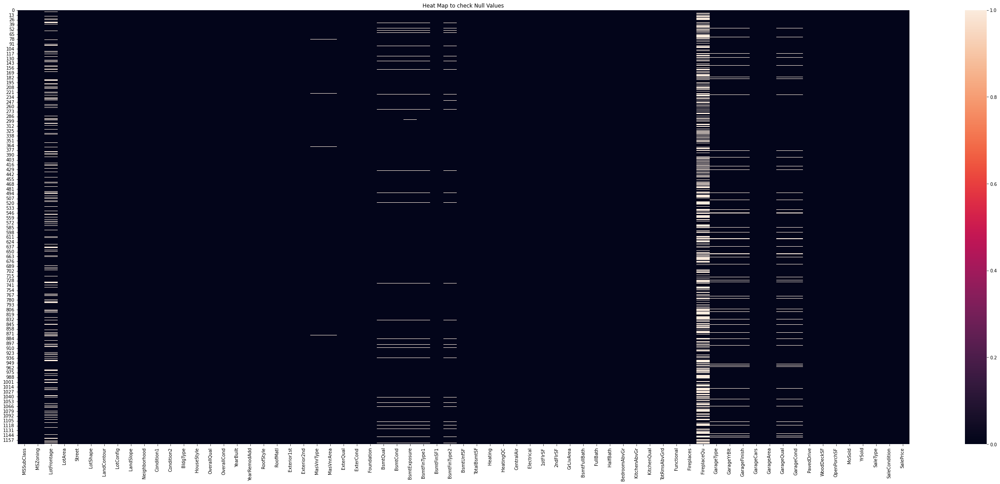

In [28]:
# lets visualize Null values in train dataset using heatmap
plt.figure(figsize=[45,18])
sns.heatmap(df.isnull())
plt.title("Heat Map to check Null Values")
plt.show()

* Here in this heatmap also, we can see that there are lot of null values present in many columns in the train dataset. lets now assign values using Imputation Method.

In [29]:
# lets split Categorical and integer datatype columns present in the train dataset.
df_category=[]
df_integer=[]
for i in df.columns:
    if df[i].dtypes=='object':
        df_category.append(i)
    else:
        df_integer.append(i)

In [30]:
print(df_category)
print('==========================================')
print(df_integer)

['MSZoning', 'Street', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']
['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'MoSold', 'YrSold', 'SalePrice']


* Here we have successfully splitted categorical in integer columns present in the train dataset. now we will initiate imputation method, instead of implimenting separately on each column. let me, replace all 0 values in all categorical columns with mode of that column and for all integer columns we will replace 0 with mean of that particular column.

# Imputation method in train dataset:

In [31]:
# lets replace all 0 values with mode of that column in all category columns
colval=df.columns.values
for i in range(0,len(colval)):
    if df[colval[i]].dtype=='object':
        df[colval[i]].fillna(df[colval[i]].mode()[0],inplace=True)

In [32]:
# lets replace all 0 values with mean of that column in all integer columns in train dataset
for i in range(0,len(colval)):
    if df[colval[i]].dtypes!='object':
        df[colval[i]].fillna(df[colval[i]].mean(),inplace=True)

* Here we have assigned values to all the zero values present in all the columns of the train dataset.

In [33]:
# lets check Null values again in train dataset
df.isnull().sum()

MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LotShape         0
LandContour      0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
GrLivArea        0
BsmtFullBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual      0
TotRmsAbvGrd     0
Functional       0
Fireplaces       0
FireplaceQu      0
GarageType  

* Now here we see that we have successfully removed all null values present in columns of the train dataset.

In [34]:
# now lets check the no. of unique values present in each column of the test dataset
data.nunique()

Id               292
MSSubClass        15
MSZoning           4
LotFrontage       65
LotArea          249
Street             2
LotShape           4
LandContour        4
Utilities          2
LotConfig          5
LandSlope          3
Neighborhood      24
Condition1         8
Condition2         2
BldgType           5
HouseStyle         8
OverallQual        8
OverallCond        7
YearBuilt         84
YearRemodAdd      57
RoofStyle          5
RoofMatl           3
Exterior1st       12
Exterior2nd       14
MasVnrType         4
MasVnrArea       104
ExterQual          4
ExterCond          4
Foundation         6
BsmtQual           4
BsmtCond           3
BsmtExposure       4
BsmtFinType1       6
BsmtFinSF1       184
BsmtFinType2       6
BsmtFinSF2        32
BsmtUnfSF        231
TotalBsmtSF      224
Heating            4
HeatingQC          4
CentralAir         2
Electrical         4
1stFlrSF         238
2ndFlrSF         113
LowQualFinSF       4
GrLivArea        246
BsmtFullBath       3
BsmtHalfBath 

* Same as train dataset, here also Id is having all the unique values present in each row of the column.
* but unlike train dataset where utilities column was having only 1 unique value in entire column, here there are 2 unique values,but since we have dropped utilities column in train dataset, we will drop that column in test dataset as well, as we are prepairing model based on train dataset and we will only use test dataset for prediction purpose, so we should use same columns to get accurate predicitions.

In [35]:
# lets drop the columns which are not required in predicition.
data=data.drop(['Id','Utilities'],axis=1)

In [36]:
# now lets check the value count of each column to see if there are any unrequired data present in any of the column of the test dataset.
for i in data.columns:
    print(data[i].value_counts())
    print('==================================================♦')

20     108
60      55
50      31
120     18
30      17
160     16
80      15
90      11
70       7
180      4
190      4
45       2
75       2
85       1
40       1
Name: MSSubClass, dtype: int64
==================================================♦
RL         223
RM          55
FV          13
C (all)      1
Name: MSZoning, dtype: int64
==================================================♦
60.0     32
85.0     14
50.0     13
70.0     12
21.0      9
65.0      9
80.0      9
75.0      7
52.0      6
63.0      6
78.0      6
66.0      5
64.0      5
57.0      5
43.0      4
72.0      4
55.0      4
100.0     4
40.0      4
74.0      4
102.0     3
48.0      3
93.0      3
79.0      3
86.0      3
110.0     3
67.0      3
90.0      3
68.0      3
44.0      3
76.0      3
24.0      3
56.0      2
83.0      2
58.0      2
92.0      2
32.0      2
35.0      2
73.0      2
47.0      2
96.0      2
107.0     2
42.0      2
51.0      2
37.0      2
62.0      2
91.0      2
98.0      2
105.0     1
150.0     1
61.0      1

* Here i could not find any column with unrequired or unnecessary data.
* There are few columns with more than 80% of 0 values BsmtFinSF2, LowQualFinSF,BsmtHalfBath,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal. these columns will not help our model predicition as they are not present in the train dataset in anyway so, we need to drop them.
* Here we can also see few columns with close to 60 % 0 values, we will use Imputation method to assign values to them, we can't drop all the columns columns with null values as removing them can affect our model to predict accurately.

In [37]:
# lets drop the columns with huge no. of 0 value columns
data=data.drop(['BsmtFinSF2','LowQualFinSF','BsmtHalfBath','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','MiscVal'],axis=1)

* Here we have successfully dropped the columns which were not required as they were have huge percentage of 0 values present.

In [38]:
# lets check the shape of test dataset once again
data.shape

(292, 66)

In [39]:
# now lets check presence of null values in remaining columns of the test dataset
data.isnull().sum()

MSSubClass         0
MSZoning           0
LotFrontage       45
LotArea            0
Street             0
LotShape           0
LandContour        0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         1
MasVnrArea         1
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           7
BsmtCond           7
BsmtExposure       7
BsmtFinType1       7
BsmtFinSF1         0
BsmtFinType2       7
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
GrLivArea          0
BsmtFullBath       0
FullBath           0
HalfBath           0
BedroomAbvGr       0
KitchenAbvGr       0
KitchenQual  

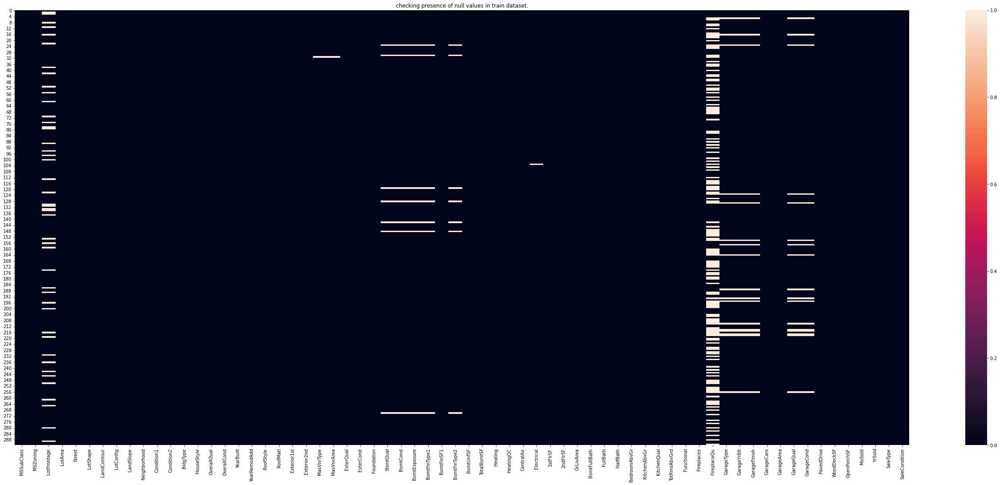

In [40]:
# lets visualize presence of null values in all the columns in test dataset using heatmap
plt.figure(figsize=[45,18])
sns.heatmap(data.isnull())
plt.title('checking presence of null values in train dataset.')
plt.show()

* Like train dataset, in test dataset also we can see the presence of null values in some ot the columns of the test dataset which we need to treat

In [41]:
# lets split Categorical and integer datatype columns present in the test dataset.
data_category=[]
data_integer=[]
for i in data.columns:
    if data[i].dtypes=='object':
        data_category.append(i)
    else:
        data_integer.append(i)

* Here we have successfully splitted columns into categorical and integer datatype.

In [42]:
print(data_category)
print('==========================================')
print(data_integer)

['MSZoning', 'Street', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']
['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'MoSold', 'YrSold']


* Here we have successfully splitted categorical in integer columns present in the test dataset. now we will initiate imputation method, instead of implimenting separately on each column. let me, replace all 0 values in all categorical columns with mode of that column and for all integer columns we will replace 0 with mean of that particular column.

# Imputation method in train dataset:

In [43]:
# lets replace all 0 values with mode of that column in all category columns of test dataset
colval1=data.columns.values
for i in range(0,len(colval1)):
    if data[colval1[i]].dtype=='object':
        data[colval1[i]].fillna(data[colval1[i]].mode()[0],inplace=True)

In [44]:
# lets replace all 0 values with mean of that column in all integer columns in test dataset
for i in range(0,len(colval1)):
    if data[colval1[i]].dtypes!='object':
        data[colval1[i]].fillna(data[colval1[i]].mean(),inplace=True)

In [45]:
# lets check the null values once again in test dataset.
data.isnull().sum()

MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LotShape         0
LandContour      0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
GrLivArea        0
BsmtFullBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual      0
TotRmsAbvGrd     0
Functional       0
Fireplaces       0
FireplaceQu      0
GarageType  

* Here we have successfully removed all null values present in the dataset.

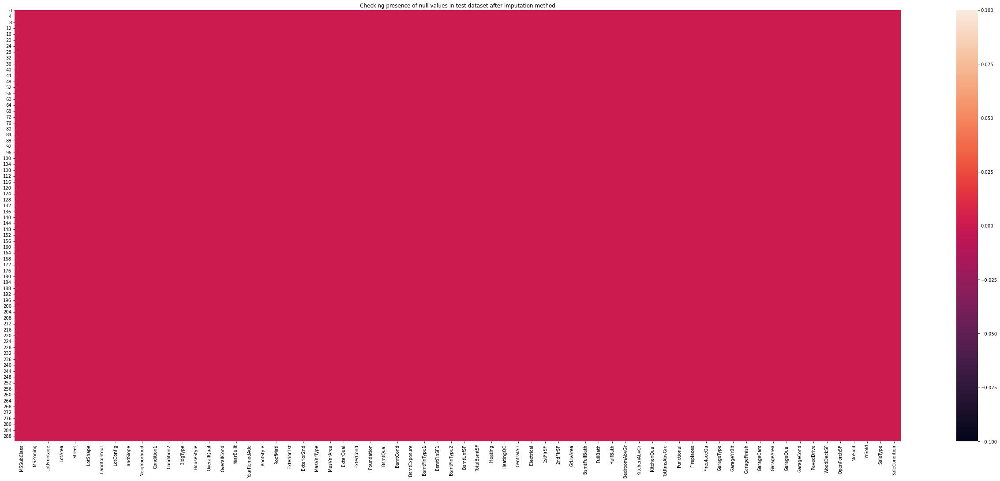

In [46]:
# lets visualize columns of test dataset once more using heatmap
plt.figure(figsize=[45,18])
sns.heatmap(data.isnull())
plt.title("Checking presence of null values in test dataset after imputation method")
plt.show()

* Here we are confirmed that now there are no null values present in the test dataset.

In [47]:
# Now lets check if there are any empty observations present in our target column SalePrice
df.loc[df['SalePrice']==" "]

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,SalePrice


* Here we can see that there are no empty observations present in our target column.

In [48]:
# As years columns present in the dataset might make things complex, lets convert them to no. of years to simplify things a little in train dataset
df['YearSince']=df['YearBuilt'].max()-df['YearBuilt']
df['YearSinceRemodAdd']=df['YearRemodAdd'].max()-df['YearRemodAdd']
df['YearSinceSold']=df['YrSold'].max()-df['YrSold']
df['GarageSince']=df['GarageYrBlt'].max()-df['GarageYrBlt']

In [49]:
# lets drop the old columns from train dataset to avoid duplications
df=df.drop(['YearBuilt','YearRemodAdd','YrSold','GarageYrBlt'],axis=1)

In [50]:
# lets convert same columns in test dataset as well
data['YearSince']=data['YearBuilt'].max()-data['YearBuilt']
data['YearSinceRemodAdd']=data['YearRemodAdd'].max()-data['YearRemodAdd']
data['YearSinceSold']=data['YrSold'].max()-data['YrSold']
data['GarageSince']=data['GarageYrBlt'].max()-data['GarageYrBlt']

In [51]:
# lets drop the old columns from test dataset to avoid duplications
data=data.drop(['YearBuilt','YearRemodAdd','YrSold','GarageYrBlt'],axis=1)

In [52]:
# Lets check the statistical description of all the columns in the train dataset
df.describe(include='all')

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,SalePrice,YearSince,YearSinceRemodAdd,YearSinceSold,GarageSince
count,1168.000000,1168,1168.000000,1168.000000,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168.000000,1168.000000,1168,1168,1168,1168,1168,1168.000000,1168,1168,1168,1168,1168,1168,1168,1168.000000,1168,1168.000000,1168.000000,1168,1168,1168,1168,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168,1168.000000,1168,1168.000000,1168,1168,1168,1168.000000,1168.000000,1168,1168,1168,1168.000000,1168.000000,1168.000000,1168,1168,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
unique,NaN,5,NaN,NaN,2,4,4,5,3,25,9,8,5,8,NaN,NaN,6,8,14,15,4,NaN,4,5,6,4,4,4,6,NaN,6,NaN,NaN,6,5,2,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,NaN,7,NaN,5,6,3,NaN,NaN,5,5,3,NaN,NaN,NaN,9,6,NaN,NaN,NaN,NaN,NaN
top,NaN,RL,NaN,NaN,Pave,Reg,Lvl,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,NaN,NaN,Gable,CompShg,VinylSd,VinylSd,None,NaN,TA,TA,CBlock,TA,TA,No,Unf,NaN,Unf,NaN,NaN,GasA,Ex,Y,SBrkr,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,TA,NaN,Typ,NaN,Gd,Attchd,Unf,NaN,NaN,TA,TA,Y,NaN,NaN,NaN,WD,Normal,NaN,NaN,NaN,NaN,NaN
freq,NaN,928,NaN,NaN,1164,740,1046,842,1105,182,1005,1154,981,578,NaN,NaN,915,1144,396,387,703,NaN,717,1022,516,547,1071,787,375,NaN,1033,NaN,NaN,1143,585,1090,1070,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,578,NaN,1085,NaN,852,755,551,NaN,NaN,1114,1125,1071,NaN,NaN,NaN,999,945,NaN,NaN,NaN,NaN,NaN
mean,56.767979,NaN,70.988470,10484.749144,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.104452,5.595890,NaN,NaN,NaN,NaN,NaN,102.310078,NaN,NaN,NaN,NaN,NaN,NaN,NaN,444.726027,NaN,569.721747,1061.095034,NaN,NaN,NaN,NaN,1169.860445,348.826199,1525.066781,0.425514,1.562500,0.388699,2.884418,1.045377,NaN,6.542808,NaN,0.617295,NaN,NaN,NaN,1.776541,476.860445,NaN,NaN,NaN,96.206336,46.559932,6.344178,NaN,NaN,181477.005993,39.069349,25.241438,2.195205,31.806159
std,41.940650,NaN,22.437056,8957.442311,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.390153,1.124343,NaN,NaN,NaN,NaN,NaN,182.047152,NaN,NaN,NaN,NaN,NaN,NaN,NaN,462.664785,NaN,449.375525,442.272249,NaN,NaN,NaN,NaN,391.161983,439.696370,528.042957,0.521615,0.551882,0.504929,0.817229,0.216292,NaN,1.598484,NaN,0.650575,NaN,NaN,NaN,0.745554,214.466769,NaN,NaN,NaN,126.158988,66.381023,2.686352,NaN,NaN,79105.586863,30.145255,20.785185,1.329738,24.198559
min,20.000000,NaN,21.000000,1300.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,1.000000,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000,0.000000,NaN,NaN,NaN,NaN,334.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,2.000000,NaN,0.000000,NaN,NaN,NaN,0.000000,0.000000,NaN,NaN,NaN,0.000000,0.000000,1.000000,NaN,NaN,34900.000000,0.000000,0.000000,0.000000,0.000000
25%,20.000000,NaN,60.000000,7621.500000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000000,5.000000,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,216.000000,799.000000,NaN,NaN,NaN,NaN,892.000000,0.000000,1143.250000,0.000000,1.000000,0.000000,2.000000,1.000000,NaN,5.000000,NaN,0.000000,NaN,NaN,NaN,1.000000,338.000000,NaN,NaN,NaN,0.000000,0.000000,5.000000,NaN,NaN,130375.000000,10.000000,6.000000,1.000000,9.000000
50%,50.000000,NaN,70.988470,9522.500000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.000000,5.000000,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,385.500000,

* Here in train data set we can see that,
* in most of the numerical columns mean is greater than median i.e. 50% percentile, which tells that data is right skewed.
* There is also huge difference in 75% percentile and max which tell that outliers are also present in almost all the numerical columns which we need to treat.
* even Standard deviation is quite high in most of the columns except few which tells us that data is spreaded.

In [53]:
# lets check the statistical description of all the columns present in the test data set as well
df.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,SalePrice,YearSince,YearSinceRemodAdd,YearSinceSold,GarageSince
count,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,56.767979,70.988470,10484.749144,6.104452,5.595890,102.310078,444.726027,569.721747,1061.095034,1169.860445,348.826199,1525.066781,0.425514,1.562500,0.388699,2.884418,1.045377,6.542808,0.617295,1.776541,476.860445,96.206336,46.559932,6.344178,181477.005993,39.069349,25.241438,2.195205,31.806159
std,41.940650,22.437056,8957.442311,1.390153,1.124343,182.047152,462.664785,449.375525,442.272249,391.161983,439.696370,528.042957,0.521615,0.551882,0.504929,0.817229,0.216292,1.598484,0.650575,0.745554,214.466769,126.158988,66.381023,2.686352,79105.586863,30.145255,20.785185,1.329738,24.198559
min,20.000000,21.000000,1300.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,34900.000000,0.000000,0.000000,0.000000,0.000000
25%,20.000000,60.000000,7621.500000,5.000000,5.000000,0.000000,0.000000,216.000000,799.000000,892.000000,0.000000,1143.250000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1.000000,338.000000,0.000000,0.000000,5.000000,130375.000000,10.000000,6.000000,1.000000,9.000000
50%,50.000000,70.988470,9522.500000,6.000000,5.000000,0.000000,385.500000,474.000000,1005.500000,1096.500000,0.000000,1468.500000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,2.000000,480.000000,0.000000,24.000000,6.000000,163995.000000,38.000000,17.000000,2.000000,31.806159
75%,70.000000,79.250000,11515.500000,7.000000,6.000000,160.000000,714.500000,816.000000,1291.500000,1392.000000,729.000000,1795.000000,1.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2.000000,576.000000,171.000000,70.000000,8.000000,215000.000000,56.000000,44.000000,3.000000,48.000000
max,190.000000,313.000000,164660.000000,10.000000,9.000000,1600.000000,5644.000000,2336.000000,6110.000000,4692.000000,2065.000000,5642.000000,3.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,4.000000,1418.000000,857.000000,547.000000,12.000000,755000.000000,135.000000,60.000000,4.000000,110.000000


* Here in the test dataset also we have the same observation as it was in train dataset.

# Univariate Analysis:

In [54]:
# lets split categorical and integer datatype column for visualization
categorical=[]
numerical=[]
for i in df.columns:
    if df[i].dtypes=='object':
        categorical.append(i)
    else:
        numerical.append(i)
print(categorical)
print('===============================')
print(numerical)

['MSZoning', 'Street', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']
['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'MoSold', 'SalePrice', 'YearSince', 'YearSinceRemodAdd', 'YearSinceSold', 'GarageSince']


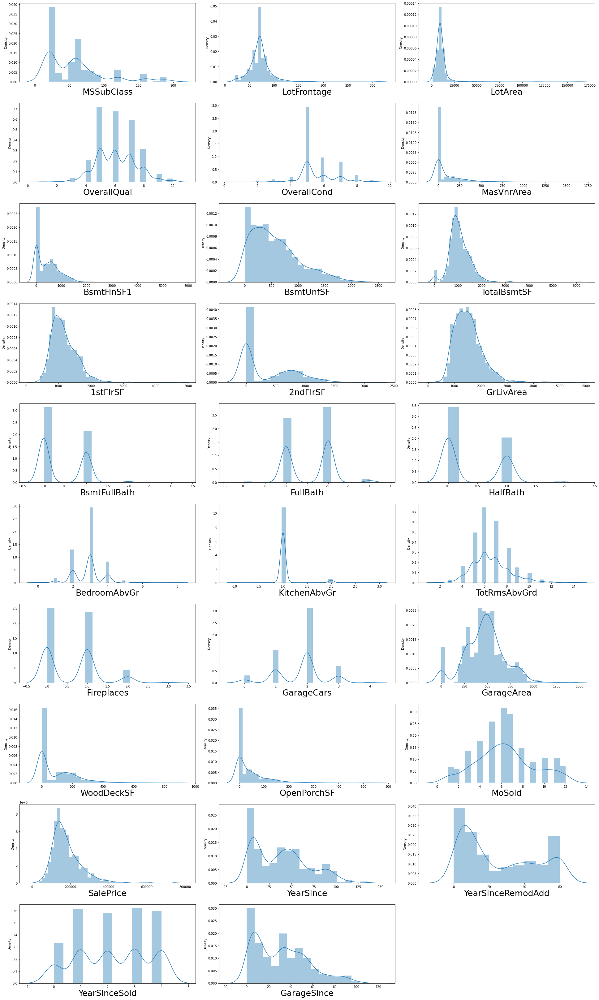

In [55]:
# lets visualize all numerical columns using distribution plots
plt.figure(figsize=(27,45))
no=1
for i in df[numerical]:
    if no <=30:
        ax=plt.subplot(10,3,no)
        sns.distplot(df[i])
        plt.xlabel(i,fontsize=27)
    no+=1
plt.tight_layout()

* Here we can observe all the numerical columns are having skewness.
* Most of the columns are right skewed as observed in statistical description.

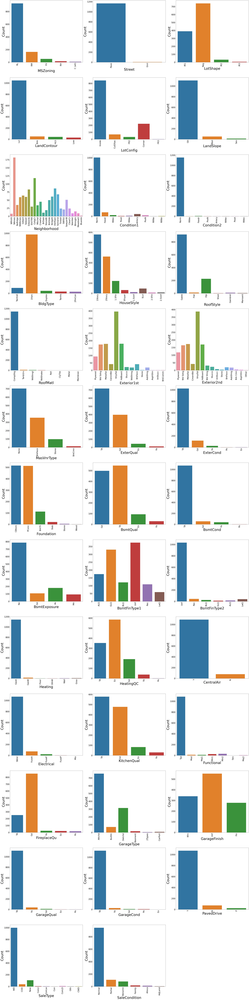

In [56]:
# lets visualize all categorical columns using count plot
plt.figure(figsize=(45,180))
no=1
for i in df[categorical]:
    if no<=40:
        ax=plt.subplot(13,3,no)
        sns.countplot(df[i])
        plt.xticks(rotation=90,fontsize=27)
        plt.yticks(fontsize=27)
        plt.xlabel(i,fontsize=45)
        plt.ylabel("Count",fontsize=45)
    no+=1
plt.tight_layout()

* In first pic we can see that Residential Low Density zoning has maximum count in general zoning classification of the sale(MSZoning).                                                                                                             
* In second graph we can clearly see Paved streets are prefered for type of road access to property than Gravel streets.   
* In third graph we can clearly see that Regular shaped property are most prefered then slightly irregular.                
* In 4th graph,preference is given to Near Flat/Level property in LandContour: flatness of the property.                   
* In 5th graph inside lot configured property is most prefered, then Frontage on 2 sides of property, then others in Lot Configuration(LotConfig).                                                                                                 
* In 6th graph clearly Gentle sloped property has maximum count or mostly prefered in comparission with Moderate and Severe slope in the feature Slope of property(LandSlope).                                                                        
* In 7th graph we can see that If the property is located in North Ames it is the hot area in demand then collegeCeek and then OldTown in feature Physical locations within Ames city limits(Neighborhood).                                          
* In 8th graph preference is given to where Proximity to various conditions-1 is normal then and least preference given to the place within 200' of East-West Railroad.                                                                               
* In 9th graph If the Proximity to various conditions-2 is normal then count is high while count is least for Proximity Adjasent to North-South Rail Road.                                                                                         
* In 10th graph Single-family Detached dwelling has maximum count in type of dwelling(BldgType).                           
* In 11th graph One story dwelling housestyle has maximum count in Style of dwelling(HouseStyle).                           
* In 12th graph For Gable roof style the count is high in Type of roof(RoofStyle).                                         
* In 13th graph For Standard (Composite) Shingle roof material the count is high in Roof material(RoofMatl).               
* In 14th graph For Vinyl Siding exterior-1 covering on house has maximum counts in Exterior covering on house(Exterior1st). 
* In 15th graph For Vinyl Siding exterior-2 covering on house has maximum counts in Exterior covering on house (if more than one material)(Exterior2nd).                                                                                          
* In 16th graph For Masonry veneer type(MasVnrType) None has maximum count.                                  
* In 17th graph For Typical/Average(TA) quality of the material on the exterior has maximum count in Evaluates the quality of the material on the exterior (ExterQual).                                                                               
* In 18th graphFor Typical/Average(TA) condition of the material on the exterior has maximum count in Evaluates the present condition of the material on the exterior(ExterCond).                                                                       
* In 19th graph For Cinder Block and Poured Contrete foundations the count is maximum in Type of foundation(Foundation).   
* In 20th graph For good and average quality heights of the basement the count is high in Evaluates the height of the basement(BsmtQual).                                                                                                         
* In 21st graph For Typical/Average(TA) general condition of the basement the count is high in Evaluates the general condition of the basement(BsmtCond).                                                                                       
* In 22nd graph For No Exposure garden level walls the count is maximum in Refers to walkout or garden level walls(BsmtExposure).                                                                                                       
* In 23rd graph For unfinished Rating of basement finished area-1 the count is maximum in Rating of basement finished area(BsmtFinType1).                                                                                                        
* In 24th graph For unfinished Rating of basement finished area-2 the count is maximum in Rating of basement finished area (if multiple types)(BsmtFinType2).                                                                                         
* In 25th graph For Gas forced warm air furnace type of heating the count is maximum in Type of heating(Heating).           
* In 26th graph For Excellent Heating quality and condition the count is high in Heating quality and condition(HeatingQC). 
* In 27th graph For Central air conditioning-yes has maximum count in Central air conditioning(CentralAir).                 
* In 28th graph For Standard Circuit Breakers & Romex Electrical system the count is high in Electrical system(Electrical). 
* In 29th graph For Typical/Average(TA) and good Kitchen quality the count is maximum in Kitchen quality(KitchenQual).     
* In 30th graph Typical Functionality has highest count for Home functionality (Assume typical unless deductions are warranted)(Functional).                                                                                                    
* In 31st graph For good Fireplace quality the count is high in Fireplace quality(FireplaceQu).                             
* In 32nd graph If Garage location Attached to home then the count is high in Garage location(GarageType).                 
* In 33rd graph For Unfinished Interior of the garage the count is maximum in Interior finish of the garage(GarageFinish). 
* In 34th graph For Typical/Average(TA) Garage quality the count is high in Garage quality(GarageQual).                     
* In 35th graph For Typical/Average(TA) Garage condition the count is high in Garage condition(GarageCond).                
* In 36th graph For Paved driveway the count is maximum in Paved driveway(PavedDrive).                                     
* In 37th graph For Warranty Deed - Conventional type of sales the count is maximum in Type of sale(SaleType).             
* In 38th graph For Normal sales condition the count is high in Condition of sale(SaleCondition).                           

# Bivariate Analysis:

In [57]:
# lets compare all numerical columns with our target variable SalePrice to see correlation of columns with target column using barplot.
# first lets make a list of all numerical columns except our target column
num=['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'MoSold', 'YearSince', 'YearSinceRemodAdd', 'YearSinceSold', 'GarageSince']

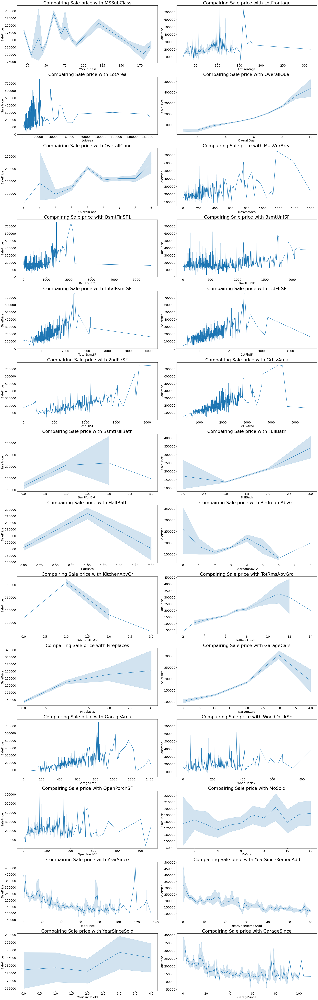

In [58]:
# Now lets compare all numerical columns with our target column using lineplot
plt.figure(figsize=(27,90))
for i in range(len(num)):
    plt.subplot(15,2,i+1)
    sns.lineplot(x=df[num[i]],y=df['SalePrice'])
    plt.title(f"Compairing Sale price with {num[i]}",fontsize=27)
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)
    plt.xlabel(num[i],fontsize=18)
    plt.ylabel('SalePrice',fontsize=18)
    plt.tight_layout()

* In 1st graph the sales is good and SalePrice is also high 1-STORY 1946 & NEWER ALL STYLES(20) and 2-STORY 1946 & NEWER(60) types of dwelling(MSSuubClass).
* In 2nd graph in Linear feet of street connected to property(LotFrontage) most of sales are happening below 135 feet but best SalePrice is between 160 to 180 feet.
* In 3rd graph Lot size in square feet(LotArea) is increseing sales is decreasing and the saleprice is in between 0-4 lakhs.
* In 4th graph Rates the overall material and finish of the house(OverallQual) is increasing linearly sales is also increasing And SalePrice is also increasing linearly.
* In 5th graph (Average) overall condition of the house(OverallCond) the sales is high and SalePrice is also high.
* In 6th graph Masonry veneer area in square feet(MasVnrArea) is increasing sales is decreasing and saleprice is rangeing between 0-4 lakhs.
* In 7th graph Type 1 finished square feet(BsmtFinSF1) is increseing sales is decreasing and the saleprice is in between 0-4 lakhs.
* In 8th graph Unfinished square feet of basement area(BsmtUnfSF) is increseing sales is decreasing and the saleprice is in between 0-4 lakhs. There are some outliers also.
* In 9th graph Total square feet of basement area(TotalBsmtSF) is increseing sales is decreasing and the saleprice is in between 0-4 lakhs.
* In 10th graph First Floor square feet(1stFlrSF) is increseing sales is decreasing and the saleprice is in between 0-4 lakhs.
* In 11th graph Second floor square feet(2ndFlrSF) is increseing sales is increasing in the range 500-1000 and the saleprice is in between 0-4 lakhs.
* In 12th graph Above grade (ground) living area square feet(GrLivArea) is increseing sales is decreasing and the saleprice is in between 0-4 lakhs.
* In 13th graph For 0 and 1 Basement full bathrooms(BsmtFullBath) the sales as well as SalePrice is high.
* In 14th graph For 1 and 2 Full bathrooms above grade(FullBath) the sales as well as SalePrice is high.
* In 15th graph For 0 and 1 Half baths above grade(HalfBath) the sales as well as SalePrice is high.
* In 16th graph For 2, 3 and 4 Bedrooms above grade (does NOT include basement bedrooms)(BedroomAbvGr) the sales as well as SalePrice is high.
* In 17th graph For 1 Kitchens above grade(KitchenAbvGr) the sales as well as SalePrice is high.
* In 18th graphFor 4-9 Total rooms above grade (does not include bathrooms)(TotRmsAbvGrd) the sales as well as SalePrice is high.
* In 19th graph For 0 and 1 Number of fireplaces(Fireplaces) the sales as well as SalePrice is high.
* In 20th graph For 1 and 2 Size of garage in car capacity(GarageCars) the sales is high and for 3 Size of garage in car capacity(GarageCars) the SalePrice is high.
* In 21st graph As Size of garage in square feet(GarageArea) is increseing sales is increseing and the saleprice is in between 0-4 lakhs.
* In 22nd graph Wood deck area in square feet(WoodDeckSF) is increseing sales is decreasing and the saleprice is in between 0-4 lakhs.
* In 23rd graph Open porch area in square feet(OpenPorchSF) is increseing sales is decreasing and the saleprice is in between 0-4 lakhs.
* In 24th graph between april to august for Month Sold(MoSold) the sales is good with SalePrice.
* In 25th graph YearSince is increseing sales is decreasing and the saleprice is high for newly built building and the sales price is in between 0-4 lakhs.
* In 26th graph Since Remodel date (same as construction date if no remodeling or additions)(YearSinceRemodAdd) is increseing sales is decreasing and the saleprice is in between 1-4 lakhs.
* In 27th graph For all the YearSinceSold the salePrice and sales both are same.
* In 28th graph Since Year garage was built(GarageAge) is increseing sales is decreasing and the saleprice is in between 0-4 lakhs.

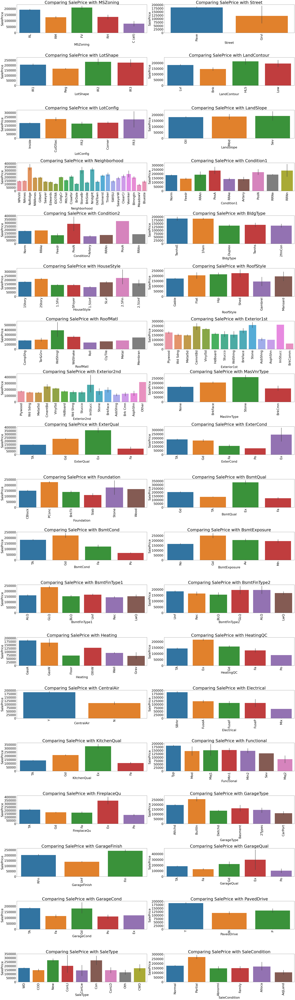

In [59]:
# now lets compare all categorical columns with our target column SalePrice
plt.figure(figsize=(36,126))
for i in range(len(categorical)):
    plt.subplot(20,2,i+1)
    sns.barplot(x=df[categorical[i]], y=df['SalePrice'])
    plt.title(f"Comparing SalePrice with {categorical[i]}",fontsize=36)
    plt.xticks(rotation=90,fontsize=27)
    plt.yticks(fontsize=27)
    plt.xlabel(categorical[i], fontsize=27)
    plt.ylabel('SalePrice',fontsize=27)
    plt.tight_layout()

* IN graph 1 Floating Village Residential(FV) and Residential Low Density(RL) zoning classification of the sale(MSZoning) the saleprice is high.
* In graph 2 paved type of road access to property(Street) the SalePrice is high.
* In graph 3 Slightly irregular(IR1), Moderately Irregular(IR2) and Irregular(IR3) shape of property(LotShape) the SalePrice is high.
* In graph 4 Hillside - Significant slope from side to side(HLS) Flatness of the property(LandContour) the SalePrice is High.
* In graph 5 Cul-de-sac(CulDSac) Lot configuration(LotConfig) the SalePrice is High.
* In graph 6 all types of Slope of property(LandSlope) i.e.,Gentle slope(Gtl), Moderate Slope(Mod) and Severe Slope(Sev) the SalePrice is High.
* In graph 7 Northridge(NoRidge) locations within Ames city limits(Neighborhood) the SalePrice is High.
* In graph 8 Within 200' of North-South Railroad(RRNn), Adjacent to postive off-site feature(PosA) and Near positive off-site feature--park, greenbelt, etc.(PosN) Proximity to various conditions(Condition1) has the maximum SalePrice.
* In graph 9 Adjacent to postive off-site feature(PosA) and Near positive off-site feature--park, greenbelt, etc.(PosN) Proximity to various conditions (if more than one is present)(Condition2) has maximum SalePrice.
* In graph 10 Single-family Detached(1Fam) and Townhouse End Unit(TwnhsE) type of dwelling(BldgType) the SalePrice is high.
* In graph 11 2Story and Two and one-half story: 2nd level finished(2.5Fin) Style of dwelling(HouseStyle) the SalePrice is high.
* In graph 12 Shed Type of roof(RoofStyle) the SalePrice is high.
* In graph 13 Wood Shingles(WdShngl) Roof material(RoofMat1) the SalePrice is high.
* In graph 14 Cement Board(CemntBd), Imitation Stucco(ImStucc) and Stone type of Exterior covering on house(Exterior1st) the SalePrice is high.
* In graph 15 Cement Board(CemntBd), Imitation Stucco(ImStucc) and other Exterior covering on house (if more than one material)(Exterior2) has maximum SalePrice.
* In graph 16 Stone Masonry veneer type(MasvnrType) the SalePrice is high.
* In graph 17 Excellent(Ex) quality of the material on the exterior(ExterQual) the SalePrice is high.
* In graph 18 Excellent(Ex) present condition of the material on the exterior(ExterCond) the SalePrice is high.
* In graph 19 Poured Contrete(PConc) Type of foundation(Foundation) the SalePrice is high.
* In graph 20 Excellent(100+ inches)(Ex) height of the basement(BsmtQual) the SalePrice is high.
* In graph 21 Good(Gd) general condition of the basement(BsmtCond) the SalePrice is high.
* In graph 22 Good Exposure(Gd) of walkout or garden level walls(BsmtExposure) has maximum SalePrice.
* In graph 23 Good Living Quarters(GLQ) of basement finished area(BsmtFinType1) has maximum SalePrice.
* In graph 24 Good Living Quarters(GLQ) and Average Living Quarters(ALQ) of basement finished area (if multiple types)(BsmtFinType2) has maximum SalePrice.
* In graph 25 Gas forced warm air furnace(GasA) and Gas hot water or steam heat(GasW) Type of heating(Heating) has high SalePrice.
* In graph 26 Excellent(Ex) Heating quality and condition(HeatingQC) the SalePriceis high.
* In graph 27 building having Central air conditioning(CentralAir) the SalePrice is high.
* In graph 28 Standard Circuit Breakers & Romex(Sbrkr) of Electrical system(Electrical) the SalePrice is Maximum.
* In graph 29 Excellent(Ex) Kitchen quality(KitchenQual) the SalePrice is high.
* In graph 30 Typical Functionality(Typ) type of Home functionality (Assume typical unless deductions are warranted)(Functional) the SalePrice is high.
* In graph 31 Excellent - Exceptional Masonry Fireplace(Ex) of Fireplace quality(FireplaceQual) has highest SalePrice.
* In graph 32 Built-In (Garage part of house - typically has room above garage)(BuiltIn) Garage location(GarageType) the SalePrice is maximum.
* In graph 33 Completely finished(Fin) Interior of the garage(GarageFinish) the SalePrice is high.
* In graph 34 Excellent(Ex) Garage quality(GarageQual) the SalePrice is high.
* In graph 35 Typical/Average(TA) and Good(Gd) Garage condition(GarageCond) the SalePrice is high.
* In graph 36 having Paved driveway(PavedDrive) the SalePriceis high.
* In graph 37 Home just constructed and sold(New) and Contract 15% Down payment regular terms(Con) of type of sale(SaleType) has highest SalePrice.
* In graph 38 Home was not completed when last assessed (associated with New Homes)(Partial) Condition of sale(SalesCondition) the SalePrice is maximum.

# Outliers:

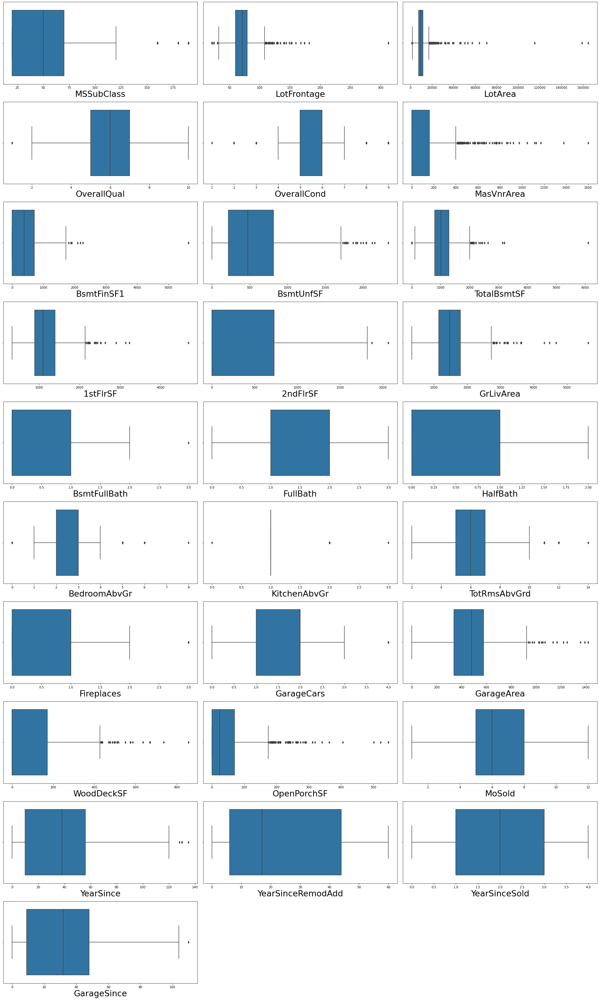

In [60]:
# lets check for presence of outliers in the dataset using boxplot in train dataset
plt.figure(figsize=(27,45))
n=1
for i in num:
    if n<=30:
        ax=plt.subplot(10,3,n)
        sns.boxplot(df[i])
        plt.xlabel(i,fontsize=27)
    n+=1
plt.tight_layout()

* Here we can see outliers are present in columns, "MSSubClass", "LotFrontage", "LotArea", "OverallQual", "OverallCond", "MasVnrArea", "BsmtFinSF1", "BsmtUnfSF", "TotalBsmtSF", "1stFlrSF", "2ndFlrSF", "GrLivArea", "BsmtFullBath", "BedroomAbvGr", "KitchenAbvGr", "TotRmsAbvGrd", "Fireplaces", "GarageCars", "GarageArea", "WoodDeckSF", "OperPorchSF", "YearSince", "GarageSince".
* Here although these are integer datatype but columns, MSSubClass, OverallQual, OverallCond, BsmtFullBath, KitchenAbvGr, Fireplaces, GarageCars have very few titles observing them feels they are categorical columns having numeric data, so we shall not remove outliers from these 3 columns.

# Removing Outliers using IQR method:

In [61]:
# lets make a list of feature columns from which we need to remove outliers
feat=df[["LotFrontage", "LotArea", "MasVnrArea", "BsmtFinSF1", "BsmtUnfSF", "TotalBsmtSF", "1stFlrSF", "2ndFlrSF", "GrLivArea", "BedroomAbvGr", "TotRmsAbvGrd", "GarageArea", "WoodDeckSF", "OpenPorchSF", "YearSince", "GarageSince"]]

In [62]:
# first quartile
q1=feat.quantile(0.25)

# third quantile
q3= feat.quantile(0.75)

# IQR method
IQR=q3 - q1

df_1=df[~((df < (q1 - 1.5 * IQR)) | (df > (q3 + 1.5 * IQR))).any(axis=1)]

In [63]:
# lets check the shape of new dataset
df_1.shape

(854, 67)

In [64]:
# lets check the dataloss for removing outliers using IQR method in train dataset
loss1=(((df.shape[0]-df_1.shape[0])/df.shape[0])*100)
loss1

26.88356164383562

* Here we can see that we are losing lot of data using IQR method, ideal recommended dataloss should be max 10%. so we will not use IQR method for removing outliers.

# Zscore Method:

In [65]:
# lets try and remove outliers using Zscore Method
# lets import library for zscore method
from scipy.stats import zscore
z=np.abs(zscore(feat))
df1=df[(z<3).all(axis=1)]

In [66]:
# lets check the shape of new dataset
df1.shape

(1060, 67)

In [67]:
# lets check the dataloss using zscore method
los1=(((df.shape[0]-df1.shape[0])/df.shape[0])*100)
los1

9.246575342465754

* Here using zscore method we are losing data 9.25% data which is below 10%. so we can use zscore method for removing outliers.

In [68]:
# Now lets check Presence of Outliers in Test Dataset
# first lets create list of all numerical feature columns present in the test dataset.
num1=[]
for i in data.columns:
    if data[i].dtypes!='object':
        num1.append(i)
print(num1)

['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'MoSold', 'YearSince', 'YearSinceRemodAdd', 'YearSinceSold', 'GarageSince']


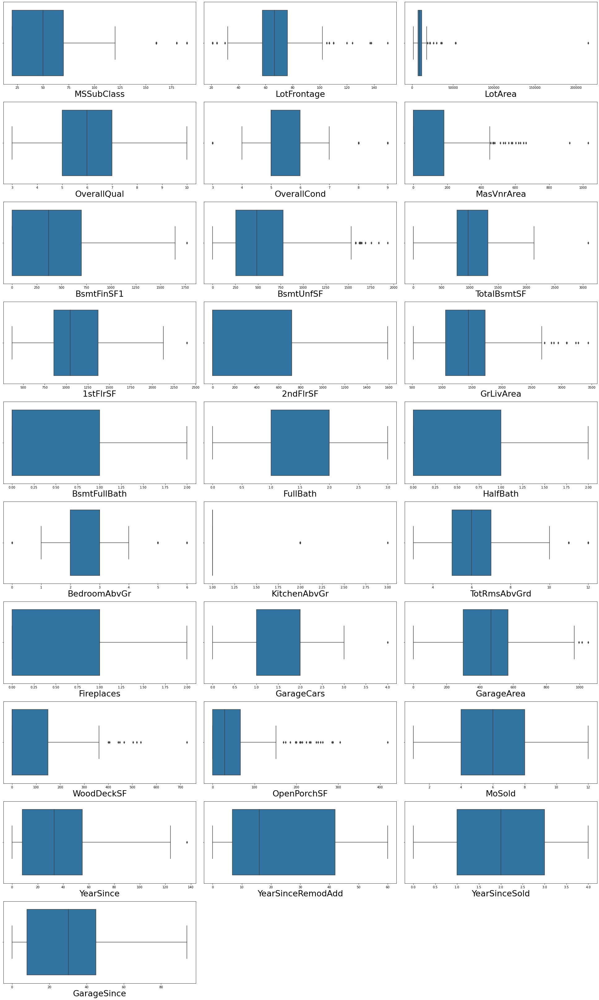

In [69]:
# lets check the presence of outliers in test dataset using boxplot
plt.figure(figsize=(27,45))
no=1
for i in num1:
    if no<=30:
        ax=plt.subplot(10,3,no)
        sns.boxplot(data[i])
        plt.xlabel(i,fontsize=27)
    no+=1
plt.tight_layout()

* Here in test dataset we can see columns with outliers present are "MsSubClass", "LotFrontage", "LotArea", "OverallCond", "MasVnrArea", "BsmtFinSF1", "BsmtUnfSF", "TotalBsmtSF", "1stFlrSF", "GrLivArea", "BedroomAbvGr", "KitchenAbvGr", "TotRmsAbvGrd", "GarageCars", "GarageArea", "WoodDeckSF", "OpenPorchSF", "YearSince"
* Here although these are integer datatype but columns, MSSubClass, OverallCond, BedroomAbvGr, KitchenAbvGr, TotRmsAbvGrd , GarageCars have very few titles observing them feels they are categorical columns having numeric data, so we shall not remove outliers from these 3 columns.

In [70]:
feat1=data[["LotFrontage", "LotArea", "MasVnrArea", "BsmtFinSF1", "BsmtUnfSF", "TotalBsmtSF", "1stFlrSF", "GrLivArea", "GarageArea", "WoodDeckSF", "OpenPorchSF", "YearSince"]]

# IQR Method:

In [71]:
# first quantile
q1=feat1.quantile(0.25)

# third quantile
q3=feat1.quantile(0.75)

# IQR
IQR = q3 - q1

data_1=data[~((data < (q1-1.5*IQR))|(data > (q3+1.5*IQR))).any(axis=1)]

* Here we have successfully removed the outliers from test dataset

In [72]:
# Now lets check the shape of the new dataset
data_1.shape

(209, 66)

In [73]:
# lets check the dataloss using IQR method
loss2=(((data.shape[0]-data_1.shape[0])/data.shape[0])*100)
loss2

28.424657534246577

* Here using IQR method we are losing far more data then recommended max. 10%. so, we will not use IQR method for removing outliers

# Zscore:

In [74]:
# lets try to remove outliers using zscore method
# we have already imported the library for zscore
z=np.abs(zscore(feat1))
data1=data[(z<3).all(axis=1)]

In [75]:
# lets check the shape of new dataset
data1.shape

(264, 66)

In [76]:
# lets check the dataloss using zscore method
loss2=(((data.shape[0]-data1.shape[0])/data.shape[0])*100)
loss2

9.58904109589041

* Here we can see that we are losing 9.59% percent data which is under recommended 10%. so, we will use zscore method to remove outliers from the test dataset

# Skewness:

In [77]:
# lets check presence of skewness in the new train dataset
df1.skew()

MSSubClass           1.401159
LotFrontage          0.103731
LotArea              1.004924
OverallQual          0.029842
OverallCond          0.516981
MasVnrArea           1.678491
BsmtFinSF1           0.651261
BsmtUnfSF            0.797217
TotalBsmtSF          0.063343
1stFlrSF             0.643093
2ndFlrSF             0.763480
GrLivArea            0.527047
BsmtFullBath         0.619481
FullBath             0.049141
HalfBath             0.713876
BedroomAbvGr        -0.072062
KitchenAbvGr         4.590364
TotRmsAbvGrd         0.425450
Fireplaces           0.699229
GarageCars          -0.378552
GarageArea          -0.107368
WoodDeckSF           1.015415
OpenPorchSF          1.495118
MoSold               0.240193
SalePrice            1.185186
YearSince            0.482790
YearSinceRemodAdd    0.456495
YearSinceSold       -0.116222
GarageSince          0.609422
dtype: float64

* Here the recommended level is +-0.50. we can see lot of columns beyond recommended limit so we need to remove skewness as well from the train dataset.
* The columns with skewness are "MsSubClass", "LotArea", "OverallCond", "MasVnrArea", "BsmtFinSF1", "BsmtUnfSF", "1stFlrSF", "2ndFlrSF", "GrLivArea", "BsmtFullBath", "HalfBath", "KitchenAbvGr", "Fireplaces", "WoodDeckSF", "OpenPorchSF", "GarageSince"

In [78]:
# lets remove skewness using yeo-johnson method in train dataset
# first lets create a list of columns in which skewness is present
fea=["MSSubClass", "LotArea", "OverallCond", "MasVnrArea", "BsmtFinSF1", "BsmtUnfSF", "1stFlrSF", "2ndFlrSF", "GrLivArea", "BsmtFullBath", "HalfBath", "KitchenAbvGr", "Fireplaces", "WoodDeckSF", "OpenPorchSF", "GarageSince"]

In [79]:
# now lets implement yeo johnson method
# lets import library for yeo-johnson method
from sklearn.preprocessing import PowerTransformer
scaler=PowerTransformer(method='yeo-johnson')
'''
parameters:
method= 'box_cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod= 'box_cox' or 'yeo-johnson'\n"

In [80]:
df1[fea]=scaler.fit_transform(df1[fea].values)

In [81]:
# now lets check the skewness again in train dataset
df1.skew()

MSSubClass           0.071733
LotFrontage          0.103731
LotArea              0.122302
OverallQual          0.029842
OverallCond          0.055026
MasVnrArea           0.446965
BsmtFinSF1          -0.412374
BsmtUnfSF           -0.315174
TotalBsmtSF          0.063343
1stFlrSF            -0.002407
2ndFlrSF             0.334150
GrLivArea           -0.006709
BsmtFullBath         0.406362
FullBath             0.049141
HalfBath             0.567614
BedroomAbvGr        -0.072062
KitchenAbvGr        -2.233708
TotRmsAbvGrd         0.425450
Fireplaces           0.131556
GarageCars          -0.378552
GarageArea          -0.107368
WoodDeckSF           0.137663
OpenPorchSF          0.035189
MoSold               0.240193
SalePrice            1.185186
YearSince            0.482790
YearSinceRemodAdd    0.456495
YearSinceSold       -0.116222
GarageSince         -0.144696
dtype: float64

* Here we have successfully removed skewness in most of the columns skewness is reduced in remaining columns. we can't lose anymore data, so, we will accept skewness in couple of columns.

In [82]:
# lets check presence of skewness in the test dataset
data1.skew()

MSSubClass           1.358699
LotFrontage         -0.109427
LotArea              1.756968
OverallQual          0.304333
OverallCond          1.205056
MasVnrArea           1.579569
BsmtFinSF1           0.775072
BsmtUnfSF            0.868567
TotalBsmtSF          0.166755
1stFlrSF             0.685380
2ndFlrSF             0.671277
GrLivArea            0.609809
BsmtFullBath         0.480039
FullBath            -0.167430
HalfBath             0.849440
BedroomAbvGr         0.006276
KitchenAbvGr         4.807459
TotRmsAbvGrd         0.611499
Fireplaces           0.565100
GarageCars          -0.290683
GarageArea           0.121210
WoodDeckSF           1.270789
OpenPorchSF          1.633645
MoSold               0.165058
YearSince            0.677689
YearSinceRemodAdd    0.495489
YearSinceSold       -0.007728
GarageSince          0.682164
dtype: float64

* Here we can see skewness is present in many columns of the dataset.
* The columns with skewness present are "MSSubClass", "LotArea", "OverallCond", "MasVnrArea", "BsmtFinSF1", "BsmtUnfSF", "1stFlrSF", "2ndFlrSF", "GrLivArea", "HalfBath", "KitchenAbvGr", "TotRmsAbvGr", "Fireplaces", "WoodDeckSF", "OpenPorchSF", "YearSince", "GarageSince".

In [83]:
# lets create a list of the columns with skewness present
fea1=["MSSubClass", "LotArea", "OverallCond", "MasVnrArea", "BsmtFinSF1", "BsmtUnfSF", "1stFlrSF", "2ndFlrSF", "GrLivArea", "HalfBath", "KitchenAbvGr", "TotRmsAbvGrd", "Fireplaces", "WoodDeckSF", "OpenPorchSF", "YearSince", "GarageSince"]

In [84]:
# we have already imported library for yeo-johnson method.
scaler = PowerTransformer(method='yeo-johnson')
'''
parameters:
method='box_cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod='box_cox' or 'yeo-johnson'\n"

In [85]:
data1[fea1]=scaler.fit_transform(data1[fea1].values)

In [86]:
# lets check the skewness once again in the test dataset
data1.skew()

MSSubClass           0.086120
LotFrontage         -0.109427
LotArea              0.149499
OverallQual          0.304333
OverallCond         -0.088316
MasVnrArea           0.408446
BsmtFinSF1          -0.416802
BsmtUnfSF           -0.281065
TotalBsmtSF          0.166755
1stFlrSF            -0.000379
2ndFlrSF             0.282572
GrLivArea           -0.008808
BsmtFullBath         0.480039
FullBath            -0.167430
HalfBath             0.694215
BedroomAbvGr         0.006276
KitchenAbvGr         4.190318
TotRmsAbvGrd         0.006581
Fireplaces           0.132564
GarageCars          -0.290683
GarageArea           0.121210
WoodDeckSF           0.260140
OpenPorchSF         -0.053085
MoSold               0.165058
YearSince           -0.156989
YearSinceRemodAdd    0.495489
YearSinceSold       -0.007728
GarageSince         -0.131859
dtype: float64

* Here we have successfully removed skewness in most of the columns it remains in couple of columns but we managed to reduce it a little. lets not remove it any further as we don't want to loose more data.

# Encoding:

In [87]:
# lets encode all categorical columns in train dataset
# lets import required library for Ordinal Encoding
from sklearn.preprocessing import OrdinalEncoder
oe= OrdinalEncoder()
for i in df1.columns:
    if df1[i].dtypes == 'object':
        df1[i]=oe.fit_transform(df1[i].values.reshape(-1,1))

In [88]:
# lets encode all categorical columns in test dataset as well
oe=OrdinalEncoder()
for i in data1.columns:
    if data1[i].dtypes == 'object':
        data1[i]=oe.fit_transform(data1[i].values.reshape(-1,1))

* here we have successfully encoded all the categorical columns present in both train and test dataset.

# MultiVariate Analysis:

In [89]:
# correlation among all the columns present in the train dataset
df1.corr()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,SalePrice,YearSince,YearSinceRemodAdd,YearSinceSold,GarageSince
MSSubClass,1.000000,0.042079,-0.340729,-0.332379,0.002771,0.047235,-0.027003,0.067664,-0.006653,-0.027997,-0.034384,-0.077267,0.593063,0.482316,0.152200,-0.044540,-0.143767,0.020045,-0.041422,-0.067314,-0.018023,-0.002226,-0.063386,0.020808,0.057388,-0.094144,-0.007360,-0.076722,0.082217,-0.101783,0.058487,-0.123165,-0.311031,0.064025,-0.025072,-0.097091,0.036695,-0.328699,0.551695,0.241179,-0.046655,0.203234,0.307895,0.045051,0.198077,-0.041199,0.181256,0.020286,0.045457,0.087597,0.086447,-0.049489,0.009318,-0.073800,-0.028640,-0.048371,-0.081985,0.055441,0.071658,0.007747,0.050073,-0.011662,0.012568,-0.007987,-0.049696,0.030158,-0.068792
MSZoning,0.042079,1.000000,-0.103904,-0.082911,0.106719,0.071920,-0.001795,-0.027194,-0.039666,-0.272818,-0.024263,0.025000,-0.010399,-0.113123,-0.172150,0.177920,0.021175,-0.003316,-0.019936,-0.007281,-0.050508,-0.028650,0.218468,-0.090527,-0.262015,0.138234,-0.007155,0.041936,0.015507,-0.025053,-0.031405,-0.046899,-0.084001,0.041208,0.132591,-0.033472,-0.094495,-0.062028,-0.013103,-0.105366,-0.024287,-0.218293,-0.132636,-0.008824,0.041056,0.146037,-0.038362,-0.094735,0.005929,-0.002938,0.147031,0.176209,-0.145887,-0.193073,-0.155508,-0.089217,-0.079306,-0.001240,-0.195489,-0.042519,0.079707,-0.000639,-0.195311,0.317946,0.188341,-0.002172,0.295225
LotFrontage,-0.340729,-0.103904,1.000000,0.599380,-0.010312,-0.150508,0.025348,-0.208979,0.006825,0.109128,-0.021876,-0.034760,-0.478101,0.044190,0.184125,-0.030476,0.154224,0.058853,0.074447,0.114817,-0.095081,0.162508,-0.097092,0.047137,0.062730,-0.144384,0.038915,-0.094469,-0.041243,0.094257,-0.028577,0.120835,0.302671,-0.048869,-0.034101,0.081427,0.067457,0.387011,-0.068200,0.302567,0.062300,0.141879,0.025785,0.277967,0.041442,-0.109436,0.301867,0.028183,0.209229,0.116398,-0.259475,-0.167038,0.263576,0.309931,0.041202,0.036951,0.110922,0.036960,0.155805,0.035066,-0.031579,0.079918,0.338705,-0.110343,-0.064856,0.017871,-0.043359
LotArea,-0.332379,-0.082911,0.599380,1.000000,-0.012379,-0.257424,-0.021323,-0.185978,0.060260,0.091761,0.068214,0.011622,-0.534089,0.005796,0.131473,0.011013,0.098263,0.073758,0.078704,0.105234,-0.046765,0.068136,-0.028459,-0.010406,0.008315,-0.072926,-0.003762,-0.102972,-0.029362,0.086612,-0.052031,0.063590,0.278090,-0.007192,-0.015484,0.042653,0.028247,0.394378,-0.018096,0.343974,0.066689,0.161105,0.041260,0.324061,-0.000941,-0.064029,0.342078,0.004233,0.269101,0.124475,-0.211716,-0.109520,0.214093,0.266771,0.034718,0.039985,0.032672,0.090500,0.121121,0.038149,-0.018825,0.066182,0.335509,-0.029485,-0.005440,0.039828,0.030723
Street,0.002771,0.106719,-0.010312,-0.012379,1.000000,-0.031536,0.081791,-0.025725,-0.081223,0.028621,0.001158,-0.001890,-0.018511,-0.022462,0.016896,0.022133,-0.035325,0.003794,0.001846,0.004335,0.018894,-0.007347,0.039993,0.042599,0.023864,-0.009201,-0.012663,0.087797,-0.016337,0.008957,-0.013252,0.039675,0.039527,0.004612,-0.060075,0.077340,0.068742,0.023429,0.036883,0.057178,-0.008507,0.043737,0.032893,0.020614,0.006905,0.021261,0.056515,-0.010993,0.042778,0.019242,0.018086,-0.040187,0.044253,0.045978,-0.008961,-0.008283,0.076518,0.041103,0.008452,0.013995,-0.014031,0.031076,0.057394,0.000103,-0.027460,0.022699,-0.028046
LotShape,0.047235,0.071920,-0.150508,-0.257424,-0.03

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5, 19.5, 20.5, 21.5,
        22.5, 23.5, 24.5, 25.5, 26.5, 27.5, 28.5, 29.5, 30.5, 31.5, 32.5,
        33.5, 34.5, 35.5, 36.5, 37.5, 38.5, 39.5, 40.5, 41.5, 42.5, 43.5,
        44.5, 45.5, 46.5, 47.5, 48.5, 49.5, 50.5, 51.5, 52.5, 53.5, 54.5,
        55.5, 56.5, 57.5, 58.5, 59.5, 60.5, 61.5, 62.5, 63.5, 64.5, 65.5,
        66.5]),
 [Text(0, 0.5, 'MSSubClass'),
  Text(0, 1.5, 'MSZoning'),
  Text(0, 2.5, 'LotFrontage'),
  Text(0, 3.5, 'LotArea'),
  Text(0, 4.5, 'Street'),
  Text(0, 5.5, 'LotShape'),
  Text(0, 6.5, 'LandContour'),
  Text(0, 7.5, 'LotConfig'),
  Text(0, 8.5, 'LandSlope'),
  Text(0, 9.5, 'Neighborhood'),
  Text(0, 10.5, 'Condition1'),
  Text(0, 11.5, 'Condition2'),
  Text(0, 12.5, 'BldgType'),
  Text(0, 13.5, 'HouseStyle'),
  Text(0, 14.5, 'OverallQual'),
  Text(0, 15.5, 'OverallCond'),
  Text(0, 16.5, 'RoofStyle'),
  Text(0, 17.5, 'RoofMatl'),
  Te

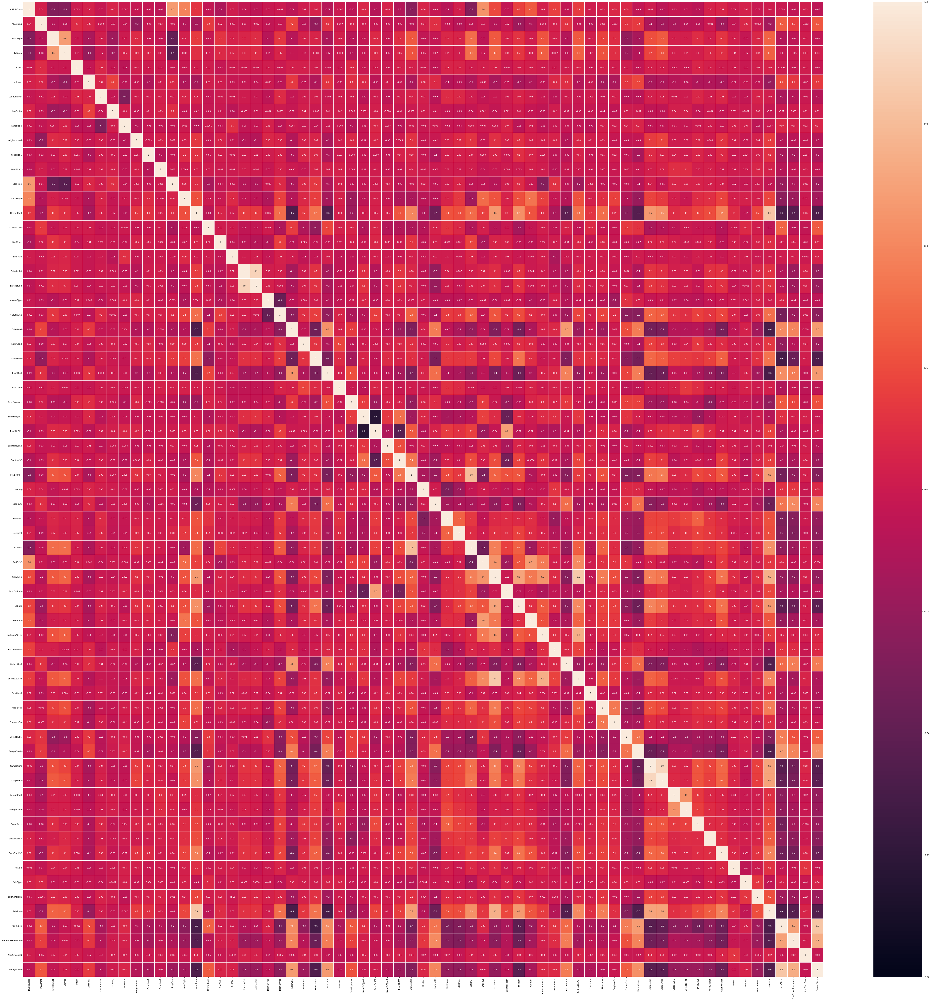

In [90]:
# Lets Visualize the correlation of all the columns using heat map
plt.figure(figsize=(90,90))
sns.heatmap(df1.corr(),linewidth=.2, vmin=-1, vmax=1, fmt='.1g',annot= True)
plt.yticks(rotation=0)

* Here we can see issue of multicolinearity present in some columns of the train dataset.

In [91]:
# lets check the correlation among all the columns in test dataset
data1.corr()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,YearSince,YearSinceRemodAdd,YearSinceSold,GarageSince
MSSubClass,1.000000,0.194026,-0.362600,-0.371865,-0.061518,0.124070,3.155720e-02,0.029562,-0.047063,-0.072957,0.070451,-0.031005,0.643548,0.444988,-0.074495,-0.012040,-0.219653,-0.005012,-0.031598,-0.126431,-0.117727,0.009197,0.003836,-0.003027,0.043714,0.057608,-0.005419,-0.069279,0.095779,-0.149721,3.378046e-02,-0.154497,-0.375103,0.044568,0.114822,-0.049206,0.068464,-0.405381,0.590199,0.195228,-0.075294,0.131385,0.356631,0.017023,0.256135,0.119900,0.110467,-0.025453,0.038284,0.112943,0.158681,0.019420,-0.037728,-0.079055,0.057052,0.102098,-0.017488,0.055736,-0.094718,0.038727,-0.096086,-0.055376,0.007042,0.020008,0.001170,-0.032829
MSZoning,0.194026,1.000000,-0.342691,-0.304821,-0.111194,0.142788,-1.283993e-01,0.065824,-0.011823,-0.214991,-0.062041,0.111194,0.175556,-0.095295,-0.295807,0.215500,-0.027038,-0.022087,-0.024152,-0.020597,0.008716,-0.123939,0.243798,-0.093525,-0.242775,0.181627,-0.086104,0.016127,0.052573,-0.159931,-3.979590e-02,-0.135740,-0.290433,0.042553,0.236359,-0.205518,-0.043091,-0.243416,0.011327,-0.241358,-0.106616,-0.273577,-0.190070,-0.136494,0.120509,0.181725,-0.172052,-0.107889,-0.151055,-0.094495,0.168167,0.282122,-0.318633,-0.315726,-0.088541,-0.076334,-0.251991,-0.095083,-0.248474,0.053130,0.122964,0.002940,0.379035,0.158364,0.087260,0.311084
LotFrontage,-0.362600,-0.342691,1.000000,0.586697,-0.153594,-0.132909,-4.774635e-02,-0.136564,0.143276,0.187721,0.060450,-0.017736,-0.455688,-0.036664,0.244962,-0.072183,0.195292,0.095880,0.042723,0.060302,0.058403,0.139214,-0.266894,0.058059,0.179128,-0.151636,0.123938,-0.082580,0.015875,0.096014,-6.391310e-03,0.156349,0.346960,-0.007520,-0.154076,0.001489,0.000896,0.427269,-0.075493,0.329814,0.068742,0.203707,0.042622,0.284584,0.039607,-0.212073,0.310237,0.074488,0.207197,0.002438,-0.248870,-0.336061,0.344802,0.361560,0.091886,0.035201,0.069024,0.025204,0.124211,-0.016037,0.036366,0.043621,-0.178753,-0.037350,-0.056052,-0.142362
LotArea,-0.371865,-0.304821,0.586697,1.000000,0.007124,-0.309515,-7.777867e-02,-0.126315,0.290193,0.116253,0.088269,-0.043232,-0.560972,-0.015433,0.185832,-0.089020,0.180084,0.046935,0.125696,0.092537,-0.004759,0.082075,-0.106833,-0.003557,0.101118,-0.088352,-0.011959,-0.096902,0.042432,0.099104,6.221918e-02,0.124295,0.324563,0.037948,-0.153214,0.049756,-0.017419,0.435532,-0.033530,0.380138,0.054458,0.192455,0.072030,0.359498,0.008823,-0.117178,0.378672,0.069689,0.202970,-0.013611,-0.206574,-0.252054,0.334515,0.336388,0.085111,-0.044505,-0.069944,0.107997,0.172811,-0.056842,0.070829,0.068968,-0.094343,-0.055578,0.004573,-0.065548
Street,-0.061518,-0.111194,-0.153594,0.007124,1.000000,0.043734,2.504291e-01,0.126885,-0.310770,0.035834,-0.351631,0.003802,-0.071132,0.026703,0.047589,0.026678,0.028998,0.005109,-0.069826,-0.065379,-0.019374,0.050968,0.155966,-0.020499,0.031612,0.021561,-0.013717,0.077512,-0.009157,0.009043,1.912704e-01,0.130706,0.028873,0.008078,-0.086437,0.251233,-0.020379,0.048845,0.053703,0.094096,-0.073546,0.063283,0.043967,0.058858,0.014033,-0.046618,0.048229,-0.012676,0.059872,0.028090,-0.061336,-0.056091,-0.026440,-0.021460,-0.014105,-0.011805,-0.018325,-0.063661,0.067084,0.025788,-0.014434,-0.009966,-0.034575,-0.065477,0.099920,-0.049963
LotShape,0.124070,0.142788,-0.132909,-0.309515,0.043734,1.000000,7

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5, 19.5, 20.5, 21.5,
        22.5, 23.5, 24.5, 25.5, 26.5, 27.5, 28.5, 29.5, 30.5, 31.5, 32.5,
        33.5, 34.5, 35.5, 36.5, 37.5, 38.5, 39.5, 40.5, 41.5, 42.5, 43.5,
        44.5, 45.5, 46.5, 47.5, 48.5, 49.5, 50.5, 51.5, 52.5, 53.5, 54.5,
        55.5, 56.5, 57.5, 58.5, 59.5, 60.5, 61.5, 62.5, 63.5, 64.5, 65.5]),
 [Text(0.5, 0, 'MSSubClass'),
  Text(1.5, 0, 'MSZoning'),
  Text(2.5, 0, 'LotFrontage'),
  Text(3.5, 0, 'LotArea'),
  Text(4.5, 0, 'Street'),
  Text(5.5, 0, 'LotShape'),
  Text(6.5, 0, 'LandContour'),
  Text(7.5, 0, 'LotConfig'),
  Text(8.5, 0, 'LandSlope'),
  Text(9.5, 0, 'Neighborhood'),
  Text(10.5, 0, 'Condition1'),
  Text(11.5, 0, 'Condition2'),
  Text(12.5, 0, 'BldgType'),
  Text(13.5, 0, 'HouseStyle'),
  Text(14.5, 0, 'OverallQual'),
  Text(15.5, 0, 'OverallCond'),
  Text(16.5, 0, 'RoofStyle'),
  Text(17.5, 0, 'RoofMatl'),
  Text(18.5, 0, 'E

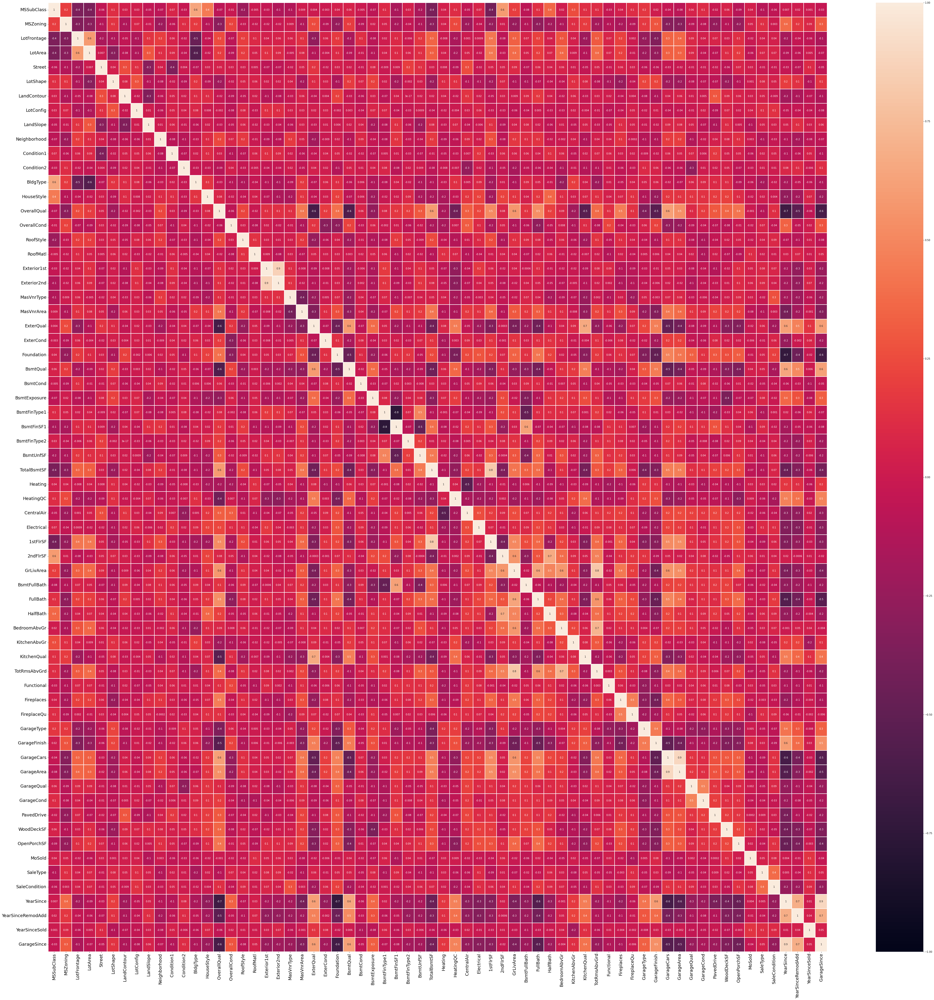

In [92]:
# lets now visualize the correlation among columns using heatmap
plt.figure(figsize=(72,72))
sns.heatmap(data1.corr(),linewidths=.2, vmin=-1, vmax=1,fmt='.1g', annot= True)
plt.yticks(rotation=0, fontsize=18)
plt.xticks(fontsize=18)

* Here in test dataset also observing this heatmap we can clearly see that issue of multicolinearity is present in some of the columns.

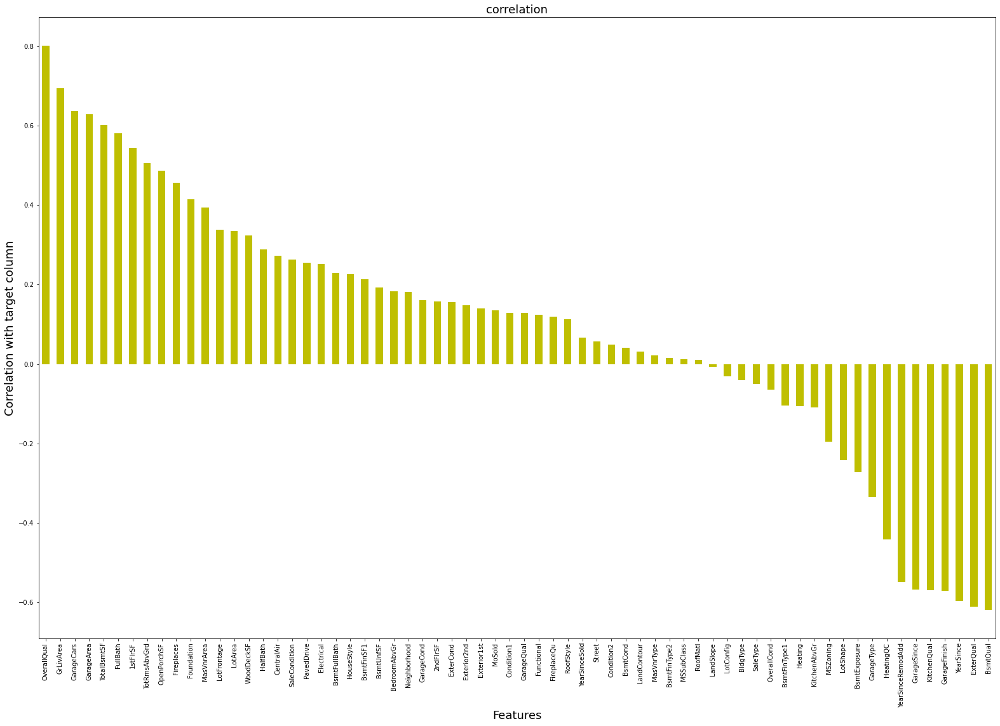

In [93]:
# lets visualize correlation of all columns with our target columns SalePrice using barplot
plt.figure(figsize=(27,18))
df1.corr()['SalePrice'].sort_values(ascending=False).drop(['SalePrice']).plot(kind='bar',color='y')
plt.xlabel('Features', fontsize=18)
plt.ylabel('Correlation with target column', fontsize=18)
plt.title('correlation', fontsize=18)
plt.show()

* Here few columns are highly negatively correlated to our target column SalePrice. But we will not drop them right now.

# lets split our feature columns and target column for training and testing.

In [94]:
X= df1.drop('SalePrice',axis=1)
y=df1['SalePrice']

* Here we have successfully splitted feature and target columns and assigned them proper varaibles.

# Standard Scaler:

In [95]:
# lets import all required libraries for standardscaler
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
x=pd.DataFrame(scaler.fit_transform(X),columns=X.columns)

In [96]:
# lets check the top 10 rows of the dataset after scaling
x.head(10)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,YearSince,YearSinceRemodAdd,YearSinceSold,GarageSince
0,1.373254,-0.037996,0.098283,-1.290571,0.043478,-1.410343,0.302091,0.591670,-0.211929,0.173595,-0.026644,0.043478,2.923742,-0.529444,-0.006489,-0.509062,-0.463407,-0.087264,-0.203199,-0.099710,0.393915,-0.808507,0.668159,0.369009,-0.548873,-0.404647,0.291245,0.612420,-1.513191,-0.089907,0.304791,0.941024,0.157387,-0.106082,1.381720,0.261817,0.306243,-0.418608,-0.848304,-1.212343,-0.819062,0.87467,-0.756528,-1.145991,-0.158825,0.800420,-0.954354,0.252841,0.864019,1.840233,-0.697182,-0.330188,0.365372,-0.112915,0.206100,0.190502,0.285601,-0.945372,1.449758,-1.625631,0.322705,0.203594,-0.172390,0.393396,0.602712,0.283057
1,-1.156822,-0.037996,1.426097,1.643262,0.043478,-1.410343,0.302091,0.591670,3.948165,0.007220,-0.026644,0.043478,-0.406904,-0.529444,1.521970,0.389360,-1.739279,10.190551,1.082718,1.049124,0.393915,-0.808507,-0.919842,-2.328576,0.880624,0.827898,-2.706036,-1.142080,-1.513191,0.424626,-0.783015,1.068404,3.194252,-0.106082,-0.909439,0.261817,0.306243,2.511416,-0.848304,1.592289,1.210368,0.87467,-0.756528,1.541510,-0.158825,-0.489011,1.118628,0.252841,0.864019,1.840233,-0.697182,0.924290,0.365372,0.796492,0.206100,0.190502,0.285601,0.824329,1.453933,1.354341,0.322705,0.203594,0.031629,0.679207,0.602712,0.526660
2,0.505865,-0.037996,1.260200,0.202213,0.043478,-1.410343,0.302091,-1.258390,-0.211929,0.506344,-0.026644,0.043478,-0.406904,1.039644,0.757741,-0.509062,-0.463407,-0.087264,-0.524679,-0.674127,0.393915,-0.808507,-0.919842,0.369009,0.880624,-0.404647,0.291245,-2.019331,-0.433795,0.963430,0.304791,-0.500107,0.261371,-0.106082,-0.909439,0.261817,0.306243,0.125850,1.211562,1.233546,1.210368,0.87467,1.314886,0.197759,-0.158825,0.800420,1.118628,0.252841,0.864019,1.840233,-0.697182,0.924290,0.365372,-0.037550,0.206100,0.190502,0.285601,1.079847,1.252922,-0.135645,0.322705,0.203594,-0.852455,-0.606946,0.602712,-0.666509
3,-1.156822,-0.037996,1.979087,0.673698,0.043478,-1.410343,0.302091,0.591670,-0.211929,0.339970,-0.026644,0.043478,-0.406904,-0.529444,-0.006489,0.389360,2.088339,-0.087264,-0.203199,-0.099710,-1.263030,1.415404,0.668159,0.369009,-0.548873,-0.404647,0.291245,0.612420,-0.973493,0.833154,0.304791,1.205895,2.199739,-0.106082,-0.909439,0.261817,0.306243,1.842536,-0.848304,0.916310,-0.819062,0.87467,-0.756528,0.197759,-0.158825,0.800420,0.427634,0.252841,0.864019,1.840233,-0.697182,-0.330188,0.365372,0.419666,0.206100,0.190502,0.285601,-0.945372,1.225331,-1.998128,-4.607998,0.203594,-0.206393,0.345760,-1.646846,0.283057
4,-1.156822,-0.037996,0.098283,1.813786,0.043478,-1.410343,0.302091,-0.641703,-0.211929,0.339970,-0.026644,0.043478,-0.406904,-0.529444,-0.006489,1.221461,-0.463407,-0.087264,-1.489117,-1.535753,2.050861,1.186259,-0.919842,0.369009,-0.548873,-0.404647,0.291245,0.612420,-1.513191,1.218097,0.304791,-0.217645,1.554505,-0.106082,0.236141,0.261817,0.306243,1.341610,-0.848304,0.424028,-0.819062,0.87467,-0.756528,0.197759,-0.158825,-0.489011,1.118628,0.252841,0.864019,1.840233,-0.697182,-1.584666,0.365372,0.334252,0.206100,0.190502,0.285601,1.168227,-1.027128,-0.135645,0.322705,0.203594,-0.206393,-0.749851,-0.896994,0.283057
5,0.505865,-0.037996,-0.619966,1.229598,0.043478,-1.410343,0.302091,0.591670,-0.211929,-0.658279,-0.026644,0.043478,-0.406904,1.039644,0.757741,-0.509062,-0.46340

* Here we have Successfully scaled the data using standard scaler.

In [97]:
# now lets scale the test dataset as well using Standard Scaler
scaler=StandardScaler()
x1=pd.DataFrame(scaler.fit_transform(data1),columns=data1.columns)

In [98]:
# lets visualize top 10 rows of the test dataset as well
x1.head(10)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,YearSince,YearSinceRemodAdd,YearSinceSold,GarageSince
0,-1.163642,-0.26657,1.157200,1.152322,0.061663,-1.426636,-2.612389,-2.057728,-0.198419,1.584397,-0.030402,-0.061663,-0.449286,-0.433045,2.292061,-0.432649,2.037804,-0.082855,0.694685,0.732502,1.909305,1.235630,-0.947008,0.33244,0.840771,-2.686604,0.222454,-1.257034,-0.403664,1.231306,0.281989,0.471520,2.371490,-0.131007,-0.882596,0.24544,0.330486,2.016268,-0.870922,1.152327,1.192719,0.868394,-0.713019,0.299177,-0.22758,-0.507206,1.142121,0.205567,0.921028,-0.455545,-0.692250,-1.618207,1.809263,1.139778,0.228750,0.19144,0.297174,1.170207,0.788709,0.305777,0.234082,0.161620,-1.305415,-1.035989,0.663169,-1.276225
1,1.326222,-0.26657,0.069420,-0.853793,0.061663,-1.426636,0.285387,-1.399255,-0.198419,1.584397,-0.030402,-0.061663,2.756430,-0.433045,1.526106,-0.432649,-0.470262,-0.082855,-1.056120,-1.234079,0.314189,-0.826569,-0.947008,0.33244,-0.512665,-0.349657,0.222454,-2.171241,-0.403664,1.098245,0.281989,-0.826640,0.569057,-0.131007,0.640315,0.24544,0.330486,0.877534,-0.870922,-0.006321,1.192719,-1.026283,-0.713019,-2.208210,-0.22758,-0.507206,-1.586383,0.205567,0.921028,-2.746288,-0.692250,-0.354282,0.428785,0.590498,0.228750,0.19144,0.297174,0.883243,-1.087923,0.667773,-6.203181,-3.251800,-0.074553,0.037330,-0.859236,0.077058
2,-1.163642,-0.26657,0.069420,0.672059,0.061663,0.725546,0.285387,0.576164,-0.198419,-1.247452,-0.030402,-0.061663,-0.449286,-0.433045,1.526106,-0.432649,2.037804,-0.082855,0.694685,0.732502,0.314189,-0.826569,-0.947008,0.33244,0.840771,-0.349657,0.222454,-2.171241,1.252823,-1.336769,0.281989,2.162163,1.937571,-0.131007,-0.882596,0.24544,0.330486,1.777797,-0.870922,0.900946,-0.812872,0.868394,-0.713019,0.299177,-0.22758,-3.033666,0.563096,0.205567,0.921028,1.835197,-0.692250,-0.354282,0.428785,0.377714,0.228750,0.19144,0.297174,1.202245,1.355044,-0.056219,0.234082,0.161620,-0.941742,-0.792053,-0.859236,-0.892565
3,0.689885,-0.26657,0.545928,0.707015,0.061663,0.725546,-4.061278,0.576164,-0.198419,-1.080873,-0.030402,-0.061663,-0.449286,0.851493,0.760152,1.380118,-0.470262,-0.082855,-0.618419,-0.578552,0.314189,-0.826569,0.635335,0.33244,-0.512665,0.818817,0.222454,0.571379,0.700661,0.301179,0.281989,-0.079274,-0.755809,-0.131007,-0.882596,0.24544,0.330486,-0.621141,1.145563,0.448487,-0.812872,-1.026283,1.397164,0.299177,-0.22758,-1.770436,0.563096,0.205567,0.921028,-0.455545,-0.692250,0.909643,-0.951693,-1.047444,0.228750,0.19144,0.297174,-0.887433,-1.087923,0.305777,0.234082,0.161620,1.045048,1.696095,-0.859236,1.376105
4,0.491090,-0.26657,1.157200,1.239210,0.061663,-1.426636,0.285387,-1.399255,-0.198419,1.417817,-1.176982,-0.061663,-0.449286,0.851493,-0.005803,-0.432649,-0.470262,-0.082855,0.694685,0.732502,1.909305,1.019444,-0.947008,0.33244,0.840771,-0.349657,0.222454,-0.342827,1.252823,-1.336769,0.281989,0.889969,-0.267971,-0.131007,-0.882596,0.24544,0.330486,-0.494805,1.219774,1.172394,-0.812872,0.868394,1.397164,1.552870,-0.22758,-0.507206,1.674586,0.205567,0.921028,-0.455545,0.432390,-1.618207,1.809263,1.100190,0.228750,0.19144,0.297174,1.016256,0.280157,-1.866200,0.234082,0.161620,-1.568464,-1.084776,-0.098034,-1.536239
5,1.749106,1.80327,-2.454859,-2.345531,0.061663,0.725546,0.285387,0.576164,-0.198419,-0.414555,-0.030402,-0.061663,1.955001,1.493763,-1.537712,0.602349,-0.470262,-0.0828

* Here we have successfully scaled the test dataset as well

# MultiColinearity:

In [99]:
# lets check the multicolinearity issue in the train dataset
# lets first import required library 
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif['vif_feat']=[variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
vif['feature']=x.columns
vif

,vif_feat,feature
0,5.920388,MSSubClass
1,1.407103,MSZoning
2,2.134882,LotFrontage
3,2.314447,LotArea
4,1.091955,Street
5,1.276584,LotShape
6,1.277284,LandContour
7,1.161638,LotConfig
8,1.337589,LandSlope
9,1.281301,Neighborhood


In [100]:
# lets drop Column with High VIF Score
x=x.drop(['GrLivArea'],axis=1)

In [101]:
# lets check variance inflation factor once again
vif=pd.DataFrame()
vif['vif_feat']=[variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
vif['feature']=x.columns
vif

,vif_feat,feature
0,5.916570,MSSubClass
1,1.406864,MSZoning
2,2.133642,LotFrontage
3,2.310181,LotArea
4,1.091944,Street
5,1.276147,LotShape
6,1.277284,LandContour
7,1.160328,LotConfig
8,1.331980,LandSlope
9,1.280055,Neighborhood


* Now issue of multicolinearity has been resolved in train dataset.

In [102]:
# lets check multicolinearity issue in test dataset using VIF
vif=pd.DataFrame()
vif['vif_feat']=[variance_inflation_factor(x1.values, i) for i in range(x1.shape[1])]
vif['feature']=x1.columns
vif

,vif_feat,feature
0,11.026413,MSSubClass
1,1.896079,MSZoning
2,2.661275,LotFrontage
3,3.387452,LotArea
4,2.242889,Street
5,1.711388,LotShape
6,1.821846,LandContour
7,1.425418,LotConfig
8,1.928355,LandSlope
9,1.676117,Neighborhood


In [103]:
# lets drop column with high VIF score
x1=x1.drop(['GrLivArea'],axis=1)

In [104]:
# lets check again whether multicolinearity issue is resolved or not
vif=pd.DataFrame()
vif['vif_feat']=[variance_inflation_factor(x1.values, i) for i in range(x1.shape[1])]
vif['feature']=x1.columns
vif

,vif_feat,feature
0,10.506099,MSSubClass
1,1.892840,MSZoning
2,2.660480,LotFrontage
3,3.340718,LotArea
4,2.183729,Street
5,1.710527,LotShape
6,1.820069,LandContour
7,1.413896,LotConfig
8,1.919156,LandSlope
9,1.675986,Neighborhood


* Here we managed to lower the collinearity in almost all the columns which was having miscollinearity issue. but now we won't be able to remove anymore columns in test dataset as removing more columns might affect our projects performance. now we have same columns present in both train and test dataset. so, lets move ahead and procceed with model building for that first step will finding the best random state and accuracy score/

# Model Building (Train Dataset):

# Best Random State:

In [105]:
# lets import all required libraries
from sklearn.metrics import accuracy_score, r2_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

In [106]:
maxacc=0
maxrs=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30, random_state=i)
    m=RandomForestRegressor()
    m.fit(x_train,y_train)
    pred=m.predict(x_test)
    acc=r2_score(y_test,pred)
    if acc>maxacc:
        maxacc=acc
        maxrs=i
print("Best Accuracy Score is : ",maxacc, "on Random_State : ",maxrs)

Best Accuracy Score is :  0.9007131398720339 on Random_State :  107


* here we have got score of 90.19 % on best random state 78

In [107]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30, random_state=78)

# As this is Regression problem we will use Regression Algorithms:

In [108]:
# lets import all necessary libraries for model building
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import ExtraTreesRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.metrics import classification_report
from sklearn import metrics
from sklearn.model_selection import cross_val_score

# 1) XGB Regressor

In [109]:
xgb=XGBRegressor()
xgb.fit(x_train,y_train)
pred=xgb.predict(x_test)
R2_Score=r2_score(y_test,pred)
print('r2_score: ',R2_Score)
print('mean_squared_error: ',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error: ',metrics.mean_absolute_error(y_test,pred))

# cross validation score
score= cross_val_score(xgb, x, y, cv=10).mean()
print("Cross Validation Score: ", score)

r2_score:  0.8755429213543253
mean_squared_error:  499134409.02854735
mean_absolute_error:  15317.156311419025
Cross Validation Score:  0.8617055030502548


# 2) Decision Tree Regressor:

In [110]:
dtr=DecisionTreeRegressor()
dtr.fit(x_train,y_train)
pred=dtr.predict(x_test)
R2_Score=r2_score(y_test,pred)
print('r2_score: ',R2_Score)
print('mean_squared_error: ',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error: ',metrics.mean_absolute_error(y_test,pred))

# cross validation score
score= cross_val_score(dtr, x, y, cv=10).mean()
print("Cross Validation Score: ", score)

r2_score:  0.6717055713614568
mean_squared_error:  1316622946.7138364
mean_absolute_error:  25881.418238993712
Cross Validation Score:  0.7033554876714299


# 3) Gradient Boosting Regressor:

In [111]:
gbr=GradientBoostingRegressor()
gbr.fit(x_train,y_train)
pred=gbr.predict(x_test)
R2_Score=r2_score(y_test,pred)
print('r2_score: ',R2_Score)
print('mean_squared_error: ',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error: ',metrics.mean_absolute_error(y_test,pred))

# cross validation score
score= cross_val_score(gbr, x, y, cv=10).mean()
print("Cross Validation Score: ", score)

r2_score:  0.9139543787171535
mean_squared_error:  345085476.8235429
mean_absolute_error:  13966.520738526257
Cross Validation Score:  0.87856772216345


# 4) Extra Trees Regressor:

In [112]:
etr=ExtraTreesRegressor()
etr.fit(x_train,y_train)
pred=etr.predict(x_test)
R2_Score=r2_score(y_test,pred)
print('r2_score: ',R2_Score)
print('mean_squared_error: ',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error: ',metrics.mean_absolute_error(y_test,pred))

# cross validation score
score= cross_val_score(etr, x, y, cv=10).mean()
print("Cross Validation Score: ", score)

r2_score:  0.903279902652068
mean_squared_error:  387895402.6261918
mean_absolute_error:  14309.488113207546
Cross Validation Score:  0.8569968921908483


# 5) KNeighbors Regressor:

In [113]:
knn=KNN()
knn.fit(x_train,y_train)
pred=knn.predict(x_test)
R2_Score=r2_score(y_test,pred)
print('r2_score: ',R2_Score)
print('mean_squared_error: ',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error: ',metrics.mean_absolute_error(y_test,pred))

# cross validation score
score= cross_val_score(knn, x, y, cv=10).mean()
print("Cross Validation Score: ", score)

r2_score:  0.8580686079979793
mean_squared_error:  569215043.7759749
mean_absolute_error:  17887.970440251574
Cross Validation Score:  0.793634573970961


# 6) Random Forest Regressor:

In [114]:
rfr=RandomForestRegressor()
rfr.fit(x_train,y_train)
pred=rfr.predict(x_test)
R2_Score=r2_score(y_test,pred)
print('r2_score: ',R2_Score)
print('mean_squared_error: ',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error: ',metrics.mean_absolute_error(y_test,pred))

# cross validation score
score= cross_val_score(rfr, x, y, cv=10).mean()
print("Cross Validation Score: ", score)

r2_score:  0.9001517363672393
mean_squared_error:  400440895.7946937
mean_absolute_error:  14610.544150943393
Cross Validation Score:  0.8595471513462956


* Here after looking at the r2 score and cross vaildation score of all the models, least difference is observed in XGBRegressor, so, we will take XGBRegressor as our best model and will proceed for Hyper Parameter Tuning.

# Hyper Parameter Tuning for Best Model:

In [115]:
# Lets import all required libraries for hyperparameter tuning
from sklearn.model_selection import GridSearchCV

In [116]:
parameter = {'booster':['gbtree','gblinear'],
             'n_estimators' : [100, 500, 900], 
            'learning_rate':[0.05,0.1,0.15,0.20]}

In [117]:
gcv=GridSearchCV(XGBRegressor(),parameter,cv=5)

In [118]:
gcv.fit(x_train,y_train)

GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None,
                                    enable_categorical=False, gamma=None,
                                    gpu_id=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, max_delta_step=None,
                                    max_depth=None, min_child_weight=None,
                                    missing=nan, monotone_constraints=None,
                                    n_estimators=100, n_jobs=None,
                                    num_parallel_tree=None, predictor=None,
                                    random_state=None, reg_alpha=None,
                                    reg_lambda=None, scale_pos_weight=None,
       

In [119]:
gcv.best_params_

{'booster': 'gblinear', 'learning_rate': 0.15, 'n_estimators': 100}

In [120]:
b_model=XGBRegressor(booster="gblinear", learning_rate=0.15, n_estimators=100)
b_model.fit(x_train,y_train)
pred=b_model.predict(x_test)
print('R2_Score: ',r2_score(y_test,pred))
print('Mean_Squared_Error: ',metrics.mean_squared_error(y_test,pred))
print('Mean_Absolute_Error: ',metrics.mean_absolute_error(y_test,pred))

R2_Score:  0.8889651538489723
Mean_Squared_Error:  445304621.6274415
Mean_Absolute_Error:  16648.909939747937


* Here we have got score of 88.9% and we managed to improve score by 1.4% after hyper parameter tuning.

# Saving the Best model:

In [121]:
# lets save the model using .pkl
import joblib
joblib.dump(b_model,"PFA_House_Project.pkl")

['PFA_House_Project.pkl']

# Loading saved model and  predicting:

In [122]:
# loading saved model
model=joblib.load("PFA_House_Project.pkl")

# predicting
prediction= model.predict(x_test)
prediction

array([179612.55 ,  84585.375,  77697.63 , 110334.19 , 105388.59 ,
       179892.14 , 222118.78 , 198150.95 , 231810.9  , 139206.42 ,
       107825.164, 179415.58 , 207893.94 , 195951.84 , 145401.44 ,
       216307.11 , 152189.03 ,  55357.21 , 220078.92 , 273985.53 ,
       136911.39 , 217886.5  , 145335.17 ,  99048.15 , 192537.08 ,
       344905.44 , 154432.2  , 139299.02 , 162114.92 , 212298.31 ,
       111394.734, 122944.06 , 329296.06 , 130043.61 , 196647.64 ,
       255153.03 , 230191.08 , 112289.9  , 191233.19 , 196221.17 ,
       152478.69 , 332057.3  , 130941.18 ,  84754.945, 248022.3  ,
        94399.89 , 214307.9  , 105840.805, 168322.67 , 250195.28 ,
       310507.03 , 197715.33 , 277280.94 , 145687.81 , 205890.23 ,
       159390.23 , 179592.62 , 122721.37 , 282754.12 , 174683.05 ,
       215786.42 , 107852.17 , 182191.6  , 115565.   , 153922.2  ,
       139295.75 , 308650.7  , 280358.03 , 163499.94 , 123944.25 ,
       114671.69 , 156548.52 ,  65287.824, 240592.86 ,  70989.

In [123]:
# lets check predicted and actual SalePrice
pd.DataFrame([model.predict(x_test)[:],y_test[:]],index=["Predicted","Actual"])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317
Predicted,179612.546875,84585.375,77697.632812,110334.1875,105388.59375,179892.140625,222118.78125,198150.953125,231810.90625,139206.421875,107825.164062,179415.578125,207893.9375,195951.84375,145401.4375,216307.109375,152189.03125,55357.210938,220078.921875,273985.53125,136911.390625,217886.5,145335.171875,99048.148438,192537.078125,344905.4375,154432.203125,139299.015625,162114.921875,212298.3125,111394.734375,122944.0625,329296.0625,130043.609375,196647.640625,255153.03125,230191.078125,112289.898438,191233.1875,196221.171875,152478.6875,332057.3125,130941.179688,84754.945312,248022.296875,94399.890625,214307.90625,105840.804688,168322.671875,250195.28125,310507.03125,197715.328125,277280.9375,145687.8125,205890.234375,159390.234375,179592.625,122721.367188,282754.125,174683.046875,215786.421875,107852.171875,182191.59375,115565.0,153922.203125,139295.75,308650.6875,280358.03125,163499.9375,123944.25,114671.6875,156548.515625,65287.824219,240592.859375,70989.296875,207099.359375,132851.46875,86464.601562,137363.4375,182537.5,261588.328125,169319.625,164993.828125,156373.546875,241171.1875,242222.765625,108233.039062,147266.46875,336119.59375,322344.25,138527.234375,112171.242188,221372.609375,234668.75,219819.109375,153805.921875,219988.6875,70719.054688,232781.953125,157509.21875,131062.8125,221319.9375,261054.265625,214492.40625,232856.890625,108563.929688,164884.484375,214833.234375,157856.828125,133427.46875,255114.234375,325264.5625,211753.609375,167197.359375,87804.890625,19107.185547,132701.671875,194977.890625,105290.273438,146729.671875,89651.375,173882.78125,136049.96875,242396.375,183406.90625,95772.273438,224239.375,112904.742188,214528.59375,162919.90625,114127.335938,100459.539062,250573.390625,159466.8125,147242.234375,117516.460938,63479.507812,127047.078125,161486.203125,88633.171875,183757.125,166421.453125,112108.796875,111941.664062,166361.03125,168284.921875,162931.3125,208868.4375,152052.546875,140709.71875,156075.328125,150627.828125,208725.15625,92928.257812,116216.15625,216656.8125,153445.015625,87226.09375,149609.078125,184771.6875,152775.6875,184000.53125,208494.3125,256097.375,139062.671875,110277.210938,108327.921875,197154.984375,157740.40625,259668.828125,241860.40625,178390.5,169513.1875,181142.390625,149752.640625,287040.90625,119678.5625,168194.328125,185751.5625,222051.453125,152780.34375,205546.171875,125809.15625,246629.28125,137653.875,146857.296875,88622.59375,215322.59375,274455.5625,184267.5,167216.8125,178651.484375,123114.109375,137442.671875,140773.234375,100430.390625,297254.78125,237436.203125,170350.203125,163677.78125,224812.296875,205063.796875,294266.25,200093.453125,157254.546875,63521.613281,409510.96875,177752.46875,189550.09375,79354.164062,174632.34375,295491.25,95675.9375,177450.203125,113791.242188,218727.671875,293971.09375,12

* Here we can see that predicted values and actual values are similar/quite close.

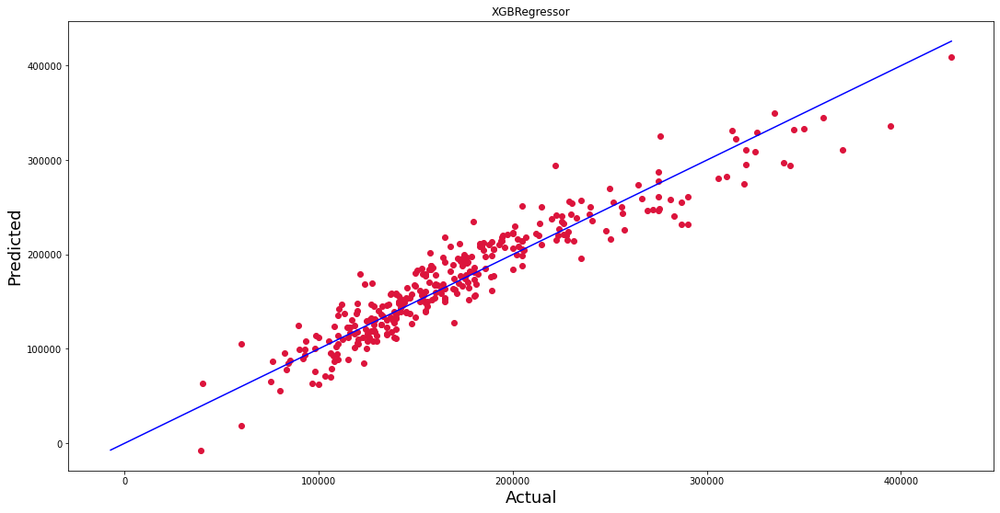

In [124]:
plt.figure(figsize=(18,9))
plt.scatter(y_test,prediction, c='crimson')
price1=max(max(prediction),max(y_test))
price2=min(min(prediction),min(y_test))
plt.plot([price1,price2],[price1,price2],"b-")
plt.xlabel("Actual",fontsize=18)
plt.ylabel("Predicted",fontsize=18)
plt.title("XGBRegressor")
plt.show()

* Here we can see red dots are predicted values and blue line denotes to Actual Values.

In [125]:
# lets predict Sale Price of houses in test dataset using our best model
prediction=model.predict(x1)
prediction

array([323759.66 , 224881.14 , 250301.7  , 189063.48 , 228391.39 ,
        75278.41 , 131973.38 , 301567.2  , 239647.6  ,  68502.79 ,
       138015.06 , 119972.16 , 141759.12 , 110021.74 , 117586.305,
       189703.02 , 216585.31 , 173744.75 , 142956.6  , 148889.75 ,
        63951.297,  98802.125, 119662.484, 180206.06 , 150461.84 ,
       163685.2  ,  67359.2  , 127035.58 , 205314.6  , 197177.58 ,
       106079.66 , 190665.97 , 214736.61 , 114850.69 , 162389.9  ,
       140613.94 ,  92256.375, 270749.84 , 224019.78 , 204180.05 ,
       153587.14 , 157106.22 , 138573.34 ,  85051.52 , 220833.2  ,
       343819.6  , 140487.27 , 209282.03 ,  90073.72 ,  79937.31 ,
       123579.18 , 163823.84 , 211972.88 , 107864.164, 249697.52 ,
        91361.07 , 186031.86 , 122997.34 , 149591.06 , 223660.66 ,
        82141.49 , 167262.66 , 227653.23 , 134365.12 , 173079.62 ,
       289565.   , 168899.56 , 174323.77 , 155957.61 , 165432.98 ,
       226990.9  , 310609.94 , 188365.44 , 275865.5  , 237678.

In [126]:
# lets make dataframe for all predicted SalePrice for test dataset
test_dataset_price=pd.DataFrame()
test_dataset_price['SalePrice']=prediction
test_dataset_price

,SalePrice
0,323759.656250
1,224881.140625
2,250301.703125
3,189063.484375
4,228391.390625
5,75278.406250
6,131973.375000
7,301567.187500
8,239647.593750
9,68502.789062


In [127]:
# lets save the predicted sale price
test_dataset_price.to_csv('data_new.csv',index=False)

* Successfully saved the predicted SalePrice of test dataset into CSV format.

# Thank you for your Time

# Project Complete